In [1]:
#hide
%reload_ext autoreload
%autoreload 2

In [2]:
import os
os.chdir("../../../test_data/system_tests/proteoforms/mann_labs_egfr")

In [3]:
SAMPLEMAP_PHOSPHO = "samplemap_phospho.tsv"
SAMPLEMAP_PROTEOME = "samplemap_egfr_100ng.tsv"

CONDPAIRS = [("untreated","egf_treated")]
CONDPAIR = CONDPAIRS[0]

RESULTS_DIR_PHOSPHO = "results_phospho"
RESULTS_DIR_PHOSPHO = "results_phospho_nocollapse"
RESULTS_DIR_PROTEOME = "results_minrep5_median_ion"
RESULTS_DIR_PROTEOME = "results_minrep5_clustp02_fcfc0_clustermerge07_single_linkage"
RESULTS_DIR_PROTEOME = "results_minrep5_clustp02_fcfc0_clustermerge05_single_linkage"
RESULTS_DIR_PROTEOME = "results_minrep5_clustp02_fcfc0_clustermerge05"
RESULTS_DIR_PROTEOME = "results_minrep5_fewclusterfilt"
RESULTS_DIR_PROTEOME = "results_minrep5_clustp02_fcfc0_clustermerge03_single_linkage"

INPUT_FILE_PHOSPHO = "20230803_163821_PhosphoLiDIA_Report.zip"
PEPTIDES_W_PHOSPHO_DETECTION = "peptides_w_phospho_detection.tsv"
INPUT_FILE_PROTEOME = "20230411_100022_20230330_Constantin_aQ2_Report.filtered_to_100ng.tsv"
PHOSPHO_PREDLIB = "../phospho_predlib/human_uniprot_reviewed_phos_prob.tsv"

OUTDIR_PLOTS = "outdir_plots"
OUTDIR_TABLES = "outdir_tables"

FC_THRESHOLD = 0.75


In [53]:
import alphaquant.visualizations as aqplot
import alphaquant.outlier_scoring as aqoutlier

outlier_handler = aqoutlier.OutlierHandler(results_dir = RESULTS_DIR_PROTEOME, cond1 = CONDPAIR[0], cond2 = CONDPAIR[1])
clusterdiff_list = outlier_handler.get_diffclust_overview_list()
print(len(clusterdiff_list))

7090


In [4]:
import alphaquant.outlier_scoring as aqoutlier
import alphaquant.diffquant.diffutils as aqutils

condpairtree_proteome = aqutils.read_condpair_tree(cond1=CONDPAIR[0], cond2=CONDPAIR[1], results_folder=RESULTS_DIR_PROTEOME)
condpairtree_ptm = aqutils.read_condpair_tree(cond1=CONDPAIR[0], cond2=CONDPAIR[1], results_folder=RESULTS_DIR_PHOSPHO)




In [40]:
import anytree
class ModifiedPeptideLoaderNonCollapsed():
    def __init__(self, condpair_tree, specific_modification = "[Phospho (STY)]"):
        self._specific_modification = specific_modification
        self._condpair_tree = condpair_tree
        self._pepname2pepnode = {}
        self._load_modified_peptides_from_tree()

    def get_complemented_pepnode(self, peptide_sequence):
        if peptide_sequence in self._pepname2pepnode.keys():
            pepnode = self._pepname2pepnode.get(peptide_sequence)
            return aqoutlier.OutlierPeptideInfo(pepnode)

    def _load_modified_peptides_from_tree(self):
        pepnodes = self._get_peptide_nodes()
        for pepnode in pepnodes:
            self._update_pepname2pepnode(pepnode)

    def _get_peptide_nodes(self):
        return anytree.search.findall(self._condpair_tree, lambda x : getattr(x,'type',"") == 'seq', maxlevel=3)

    def _update_pepname2pepnode(self, pepnode):
        self._remove_unmodified_peptides_from_pepnode(pepnode)
        if len(pepnode.children) > 0:
            self._pepname2pepnode[pepnode.name] = pepnode
        
    def _remove_unmodified_peptides_from_pepnode(self, pepnode):
        nodes_to_remove = [modified_peptide for modified_peptide in pepnode.children if not self._specific_modification in modified_peptide.name]
        for node in nodes_to_remove:
            node.parent = None


In [44]:
def get_complemented_clusters(outlier_loader, ptm_loader):
    complemented_clusters = []
    for outlier_peptide in outlier_loader.outlier_peptides:
        complemented_peptide = ptm_loader.get_complemented_pepnode(outlier_peptide.peptide_sequence)
        if complemented_peptide is not None:
            complemented_cluster = aqoutlier.ComplementedCluster(outlier_peptide, complemented_peptide)
            complemented_clusters.append(complemented_cluster)
    
    return complemented_clusters



In [45]:
import alphaquant.outlier_scoring as aqoutlier

ptm_loader = ModifiedPeptideLoaderNonCollapsed(condpairtree_ptm)

outlier_loader = aqoutlier.OutlierPeptideLoader(condpairtree_proteome)

complemented_clusters = get_complemented_clusters(outlier_loader, ptm_loader)

print(len(complemented_clusters))

1251


pval is 2.1884427787361747e-05
correlation is -0.32682438899318644
52 same, 110 opposite


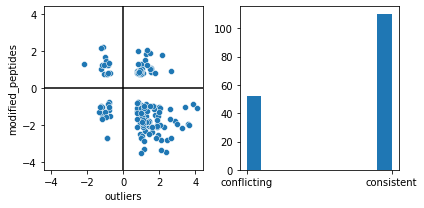

In [47]:
import matplotlib.pyplot as plt


complemented_clusters = [x for x in complemented_clusters if x.get_outlier_abs_normfc()>FC_THRESHOLD and x.get_ptm_abs_normfc()>FC_THRESHOLD]

c_evaluator = aqoutlier.ComplementedClusterEvaluator(complemented_clusters)
corr = c_evaluator.calculate_correlation()
print(f"correlation is {corr}")

fig, axes = plt.subplots(1, 2, figsize=(6, 3))

c_evaluator.scatter_fold_changes(axes[0])
c_evaluator.compare_regulation_directions(axes[1])
axes[1].set_xticks([0, 1])
axes[1].set_xticklabels(["conflicting", "consistent"])

fig.tight_layout()

fig.savefig(f"{OUTDIR_PLOTS}/compare_fc_directions.pdf")





#ax.set_xlim(-3, 3)
#ax.set_ylim(-3, 3)
plt.show()

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
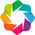

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
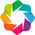

In [50]:
import alphaquant.visualizations as aqviz
quantification_info = aqviz.CondpairQuantificationInfo().init_by_loading_tables(cond1 = CONDPAIR[0], cond2 = CONDPAIR[1], results_dir = RESULTS_DIR_PROTEOME, samplemap=SAMPLEMAP_PROTEOME)
pepdf_getter = aqviz.PeptideIntensityDataframeGetter(quantification_info=quantification_info)


In [51]:
import alphaquant.outlier_scoring as aqoutlier
import alphaquant.variables as aqvar
quantification_info_ptms = aqviz.CondpairQuantificationInfo().init_by_loading_tables(cond1 = CONDPAIR[0], cond2 = CONDPAIR[1], results_dir = RESULTS_DIR_PHOSPHO, samplemap=SAMPLEMAP_PHOSPHO)
pepdf_getter_ptm = aqviz.PeptideIntensityDataframeGetter(quantification_info=quantification_info_ptms)


SEQ_ATEPPSPDAGELSLASR_
Q8IYB8
outlier fc 1.2865687033846518
modified fc 2.0213216429787293


outlier protnormed 1.2903674248284314
modified protnormed 2.025120364422509
False


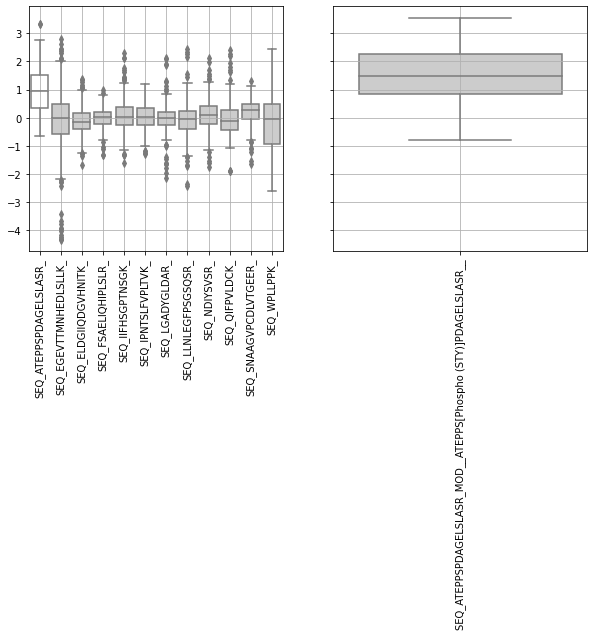

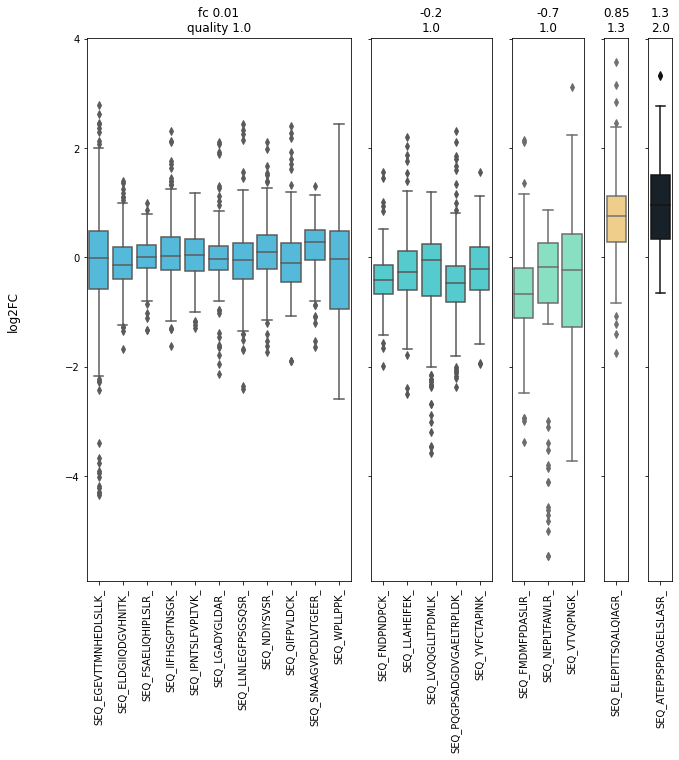

SEQ_TQPSSGVDSAVGTLPATSPQSTSVQAK_
Q13428
outlier fc 1.3368207948389288
modified fc 1.447450575041261


outlier protnormed 1.2036832609812251
modified protnormed 1.3143130411835573
False


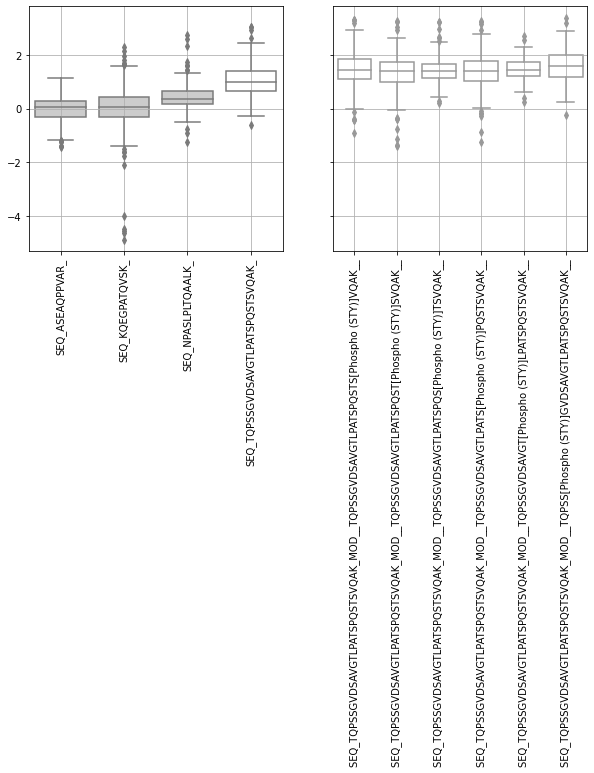

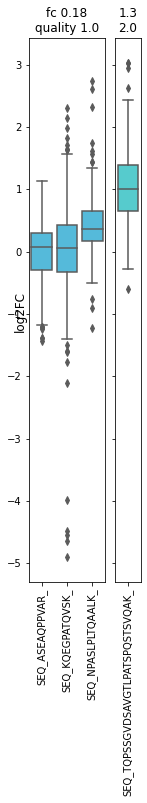

SEQ_VATPVDWK_
P30041
outlier fc -1.2731514025216235
modified fc -1.494894914610022


outlier protnormed -1.1832456948112717
modified protnormed -1.4049892068996703
False


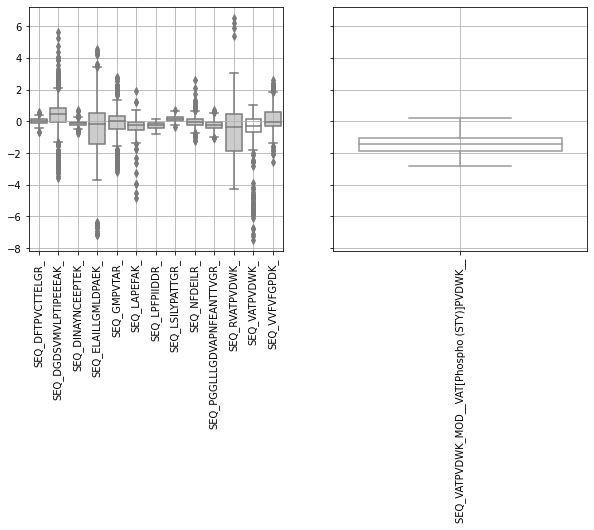

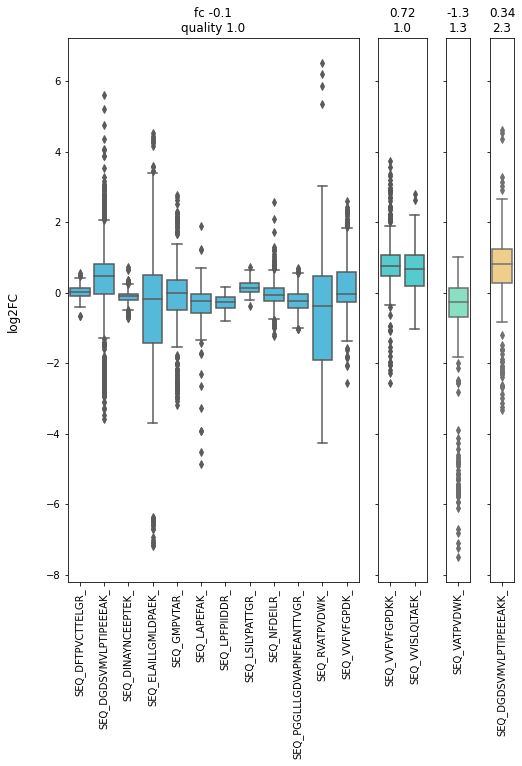

SEQ_QDVDNASLAR_
P08670
outlier fc 1.3432299176465887
modified fc 0.9157952865408135


outlier protnormed 1.5128374637459272
modified protnormed 1.085402832640152
False


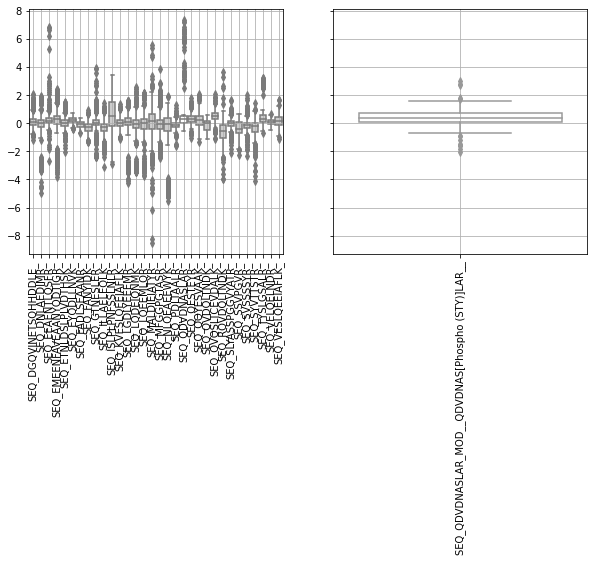

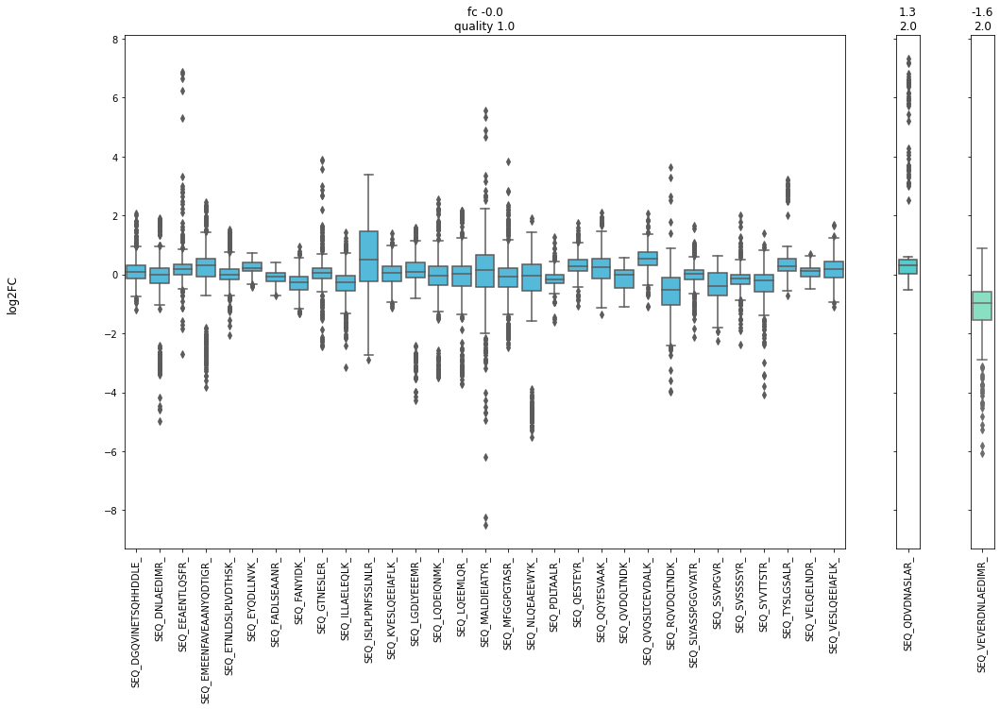

SEQ_PSPGTPTSPSNLTSGLK_
Q5VT52
outlier fc 0.8276068915968188
modified fc 0.7324037163668848


outlier protnormed 0.8643388762965515
modified protnormed 0.7691357010666175
False


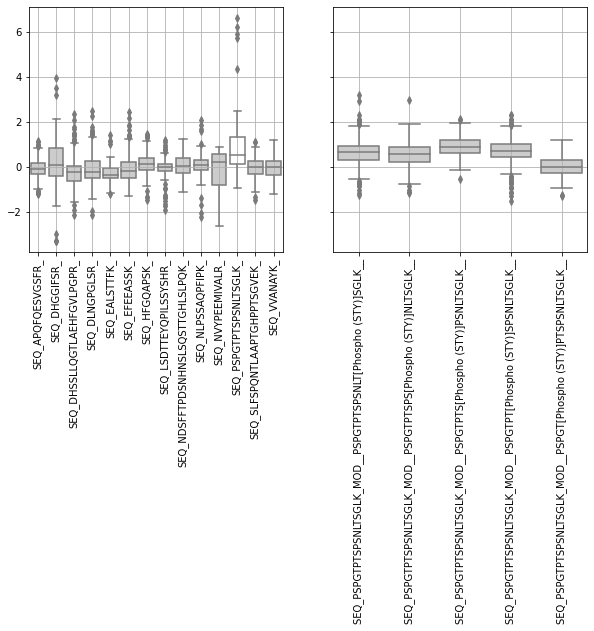

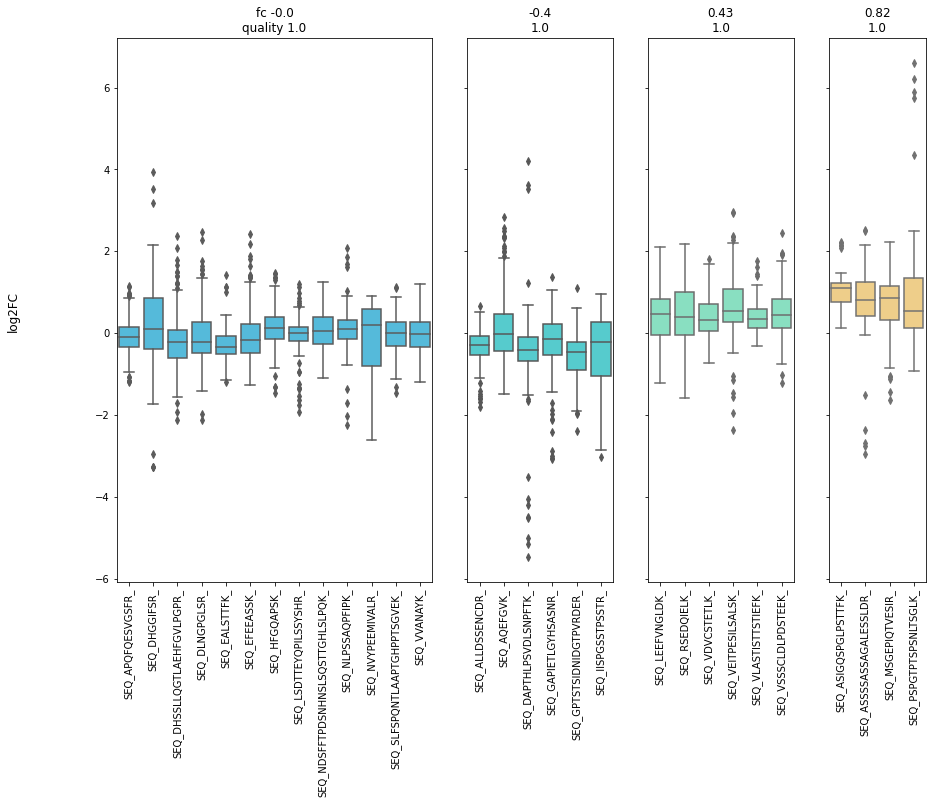

SEQ_TSIEDQDELSSLLQVPLVAGTVNR_
P56537
outlier fc 1.1877181151195124
modified fc 1.3808970740299022


outlier protnormed 1.0440639470895803
modified protnormed 1.23724290599997
False


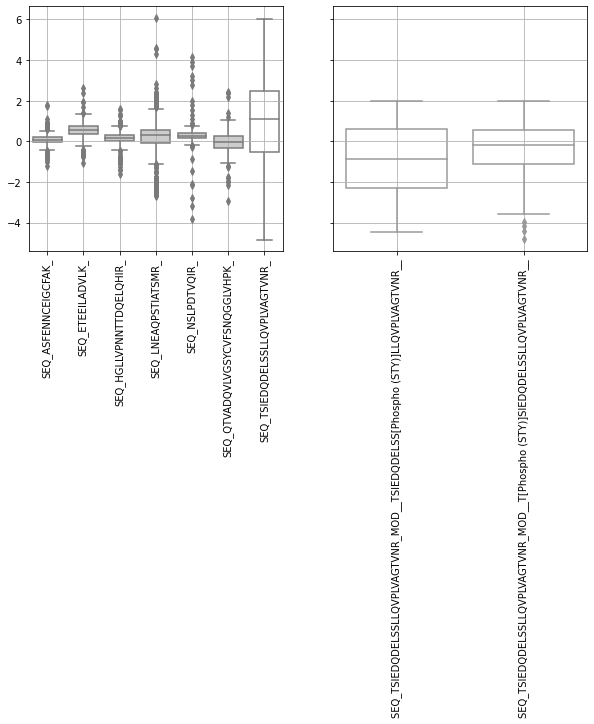

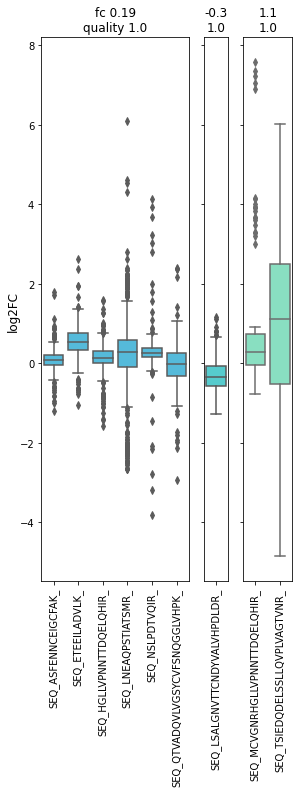

SEQ_SMDLSEYIIR_
Q9H0A0
outlier fc -0.667139223480654
modified fc -0.7094940116350876


outlier protnormed -0.7808294102222861
modified protnormed -0.8231841983767197
False


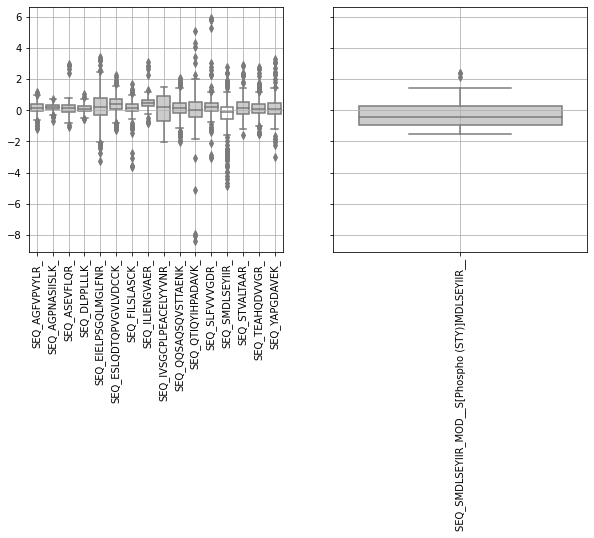

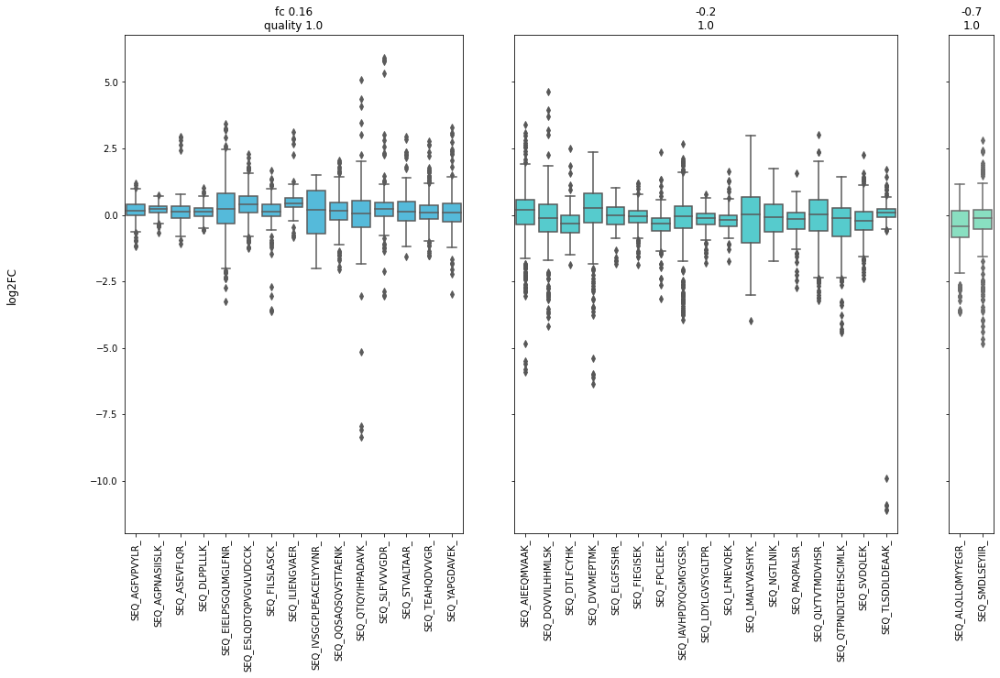

SEQ_EDSVKPGAHLTVK_
P51991
outlier fc 0.6252232456055433
modified fc 0.7510316142777935


outlier protnormed 0.7735055966312117
modified protnormed 0.8993139653034619
False


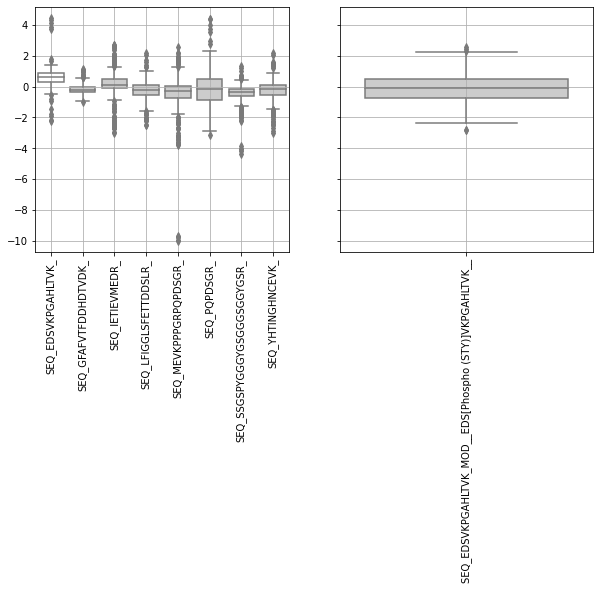

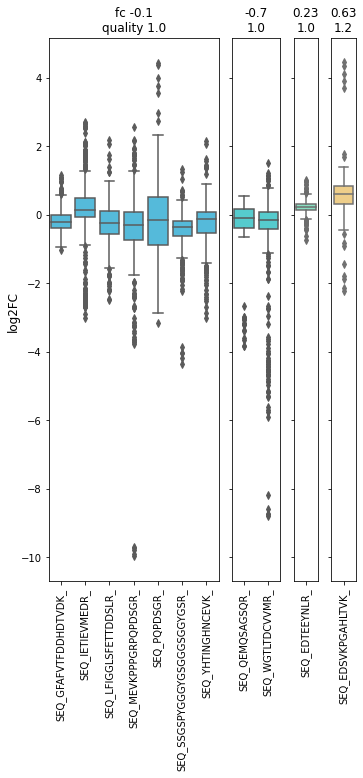

SEQ_TLPLTTAPEAGEVTPSDSGGQEDSPAK_
O95359-3
outlier fc 1.2324939286954315
modified fc 1.8201631091669488


outlier protnormed 1.2577455325409803
modified protnormed 1.8454147130124976
False


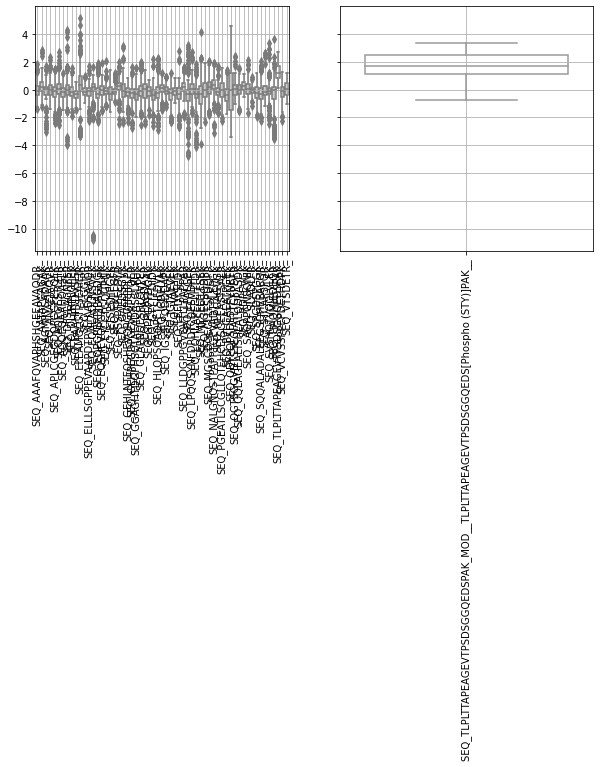

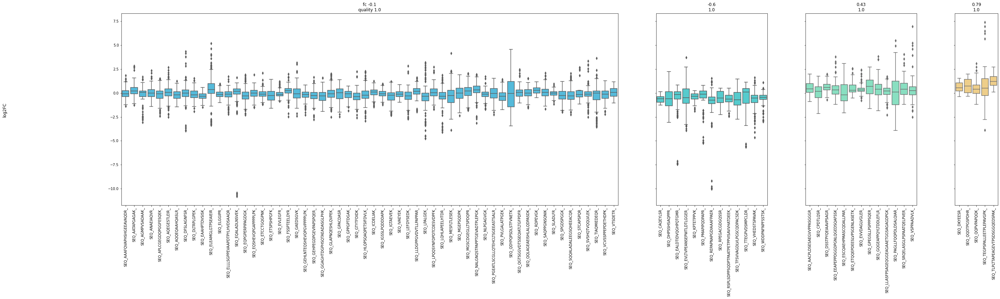

SEQ_TSPQELSEELSR_
Q96PU5;Q96PU5-2;Q96PU5-5;Q96PU5-6;Q96PU5-7
outlier fc 0.668338094123955
modified fc 0.9854644955310372


outlier protnormed 0.9725405553854558
modified protnormed 1.289666956792538
False


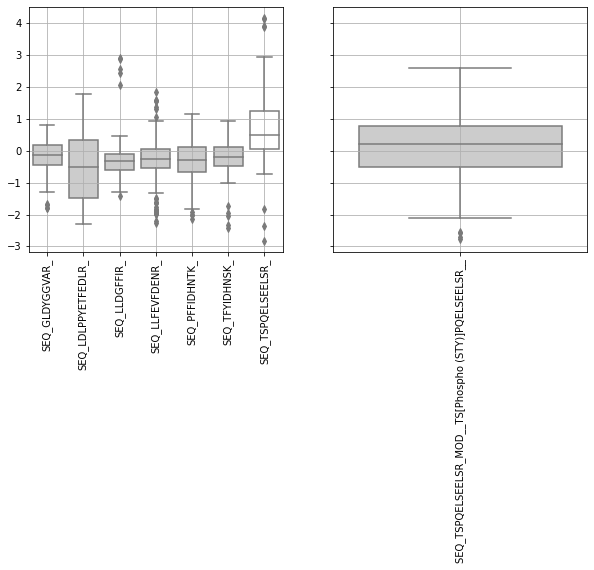

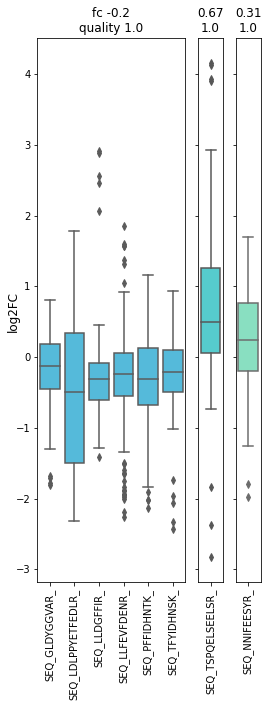

SEQ_LESPTVSTLTPSSPGK_
Q96C36
outlier fc 0.38769530025994725
modified fc 0.4590032524200254


outlier protnormed 0.7687137352834376
modified protnormed 0.8400216874435157
False


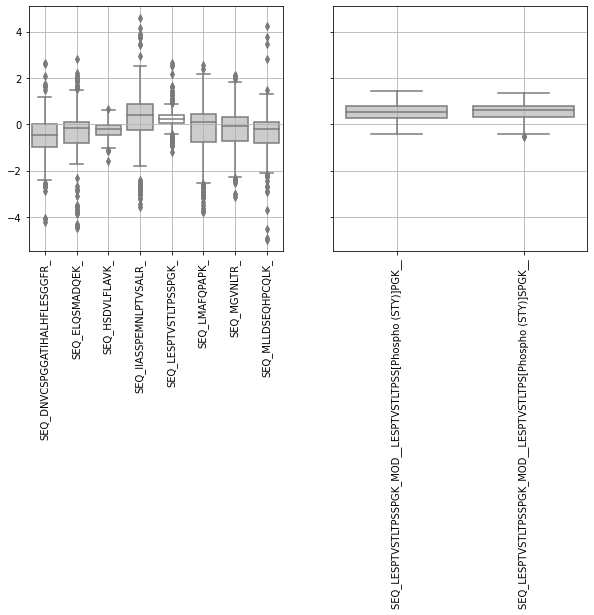

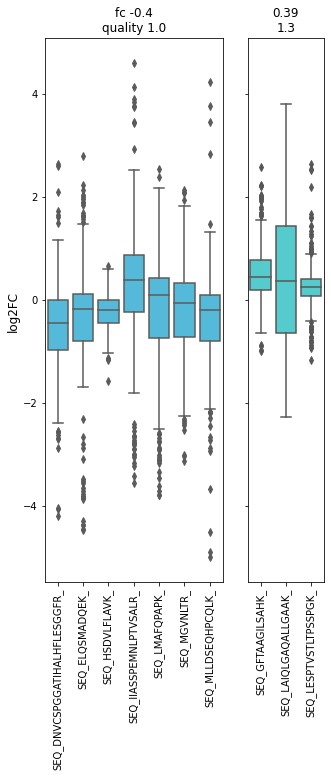

SEQ_ALVVPEPEPDSDSNQER_
Q5VTR2
outlier fc 0.7438295700933605
modified fc 0.6925109616820255


outlier protnormed 0.8638263621150581
modified protnormed 0.8125077537037232
False


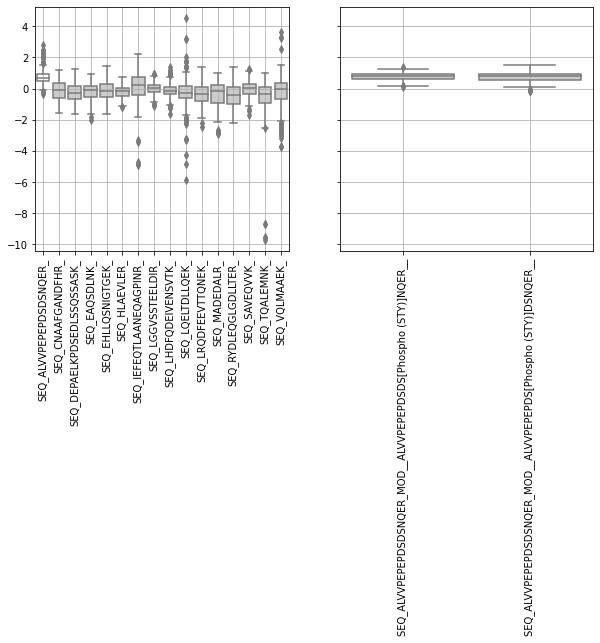

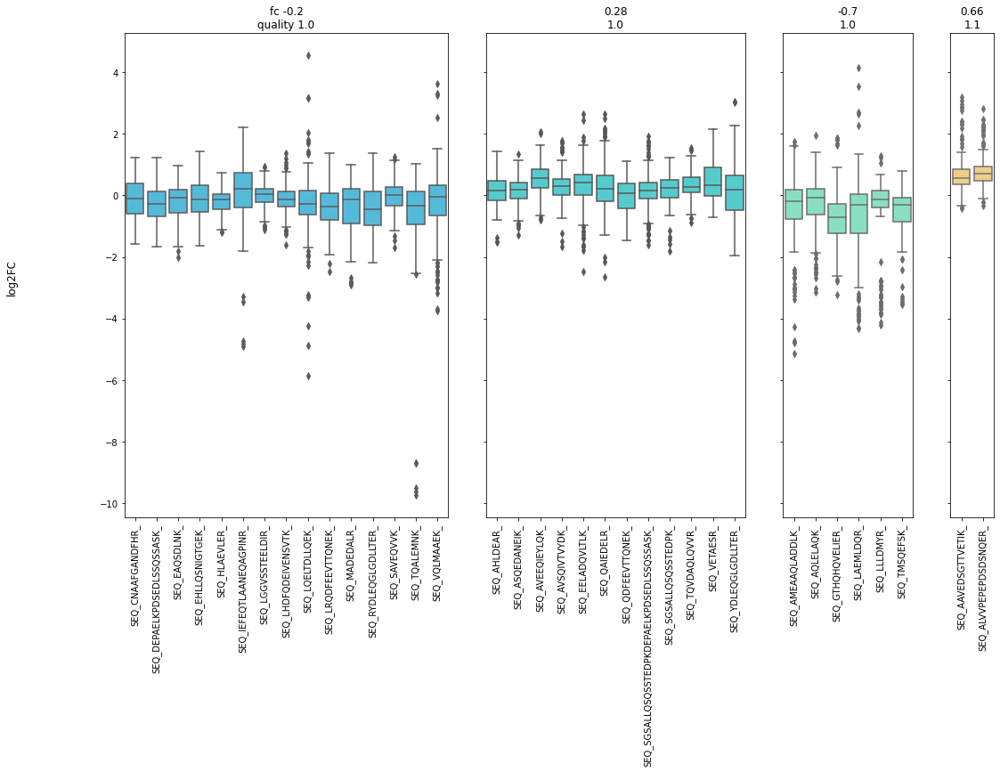

SEQ_KVEEEGSPGDPDHEASTQGR_
Q9NZT2;Q9NZT2-2
outlier fc -0.8064703887426171
modified fc -0.7504830510470241


outlier protnormed -0.8268353998739658
modified protnormed -0.7708480621783728
False


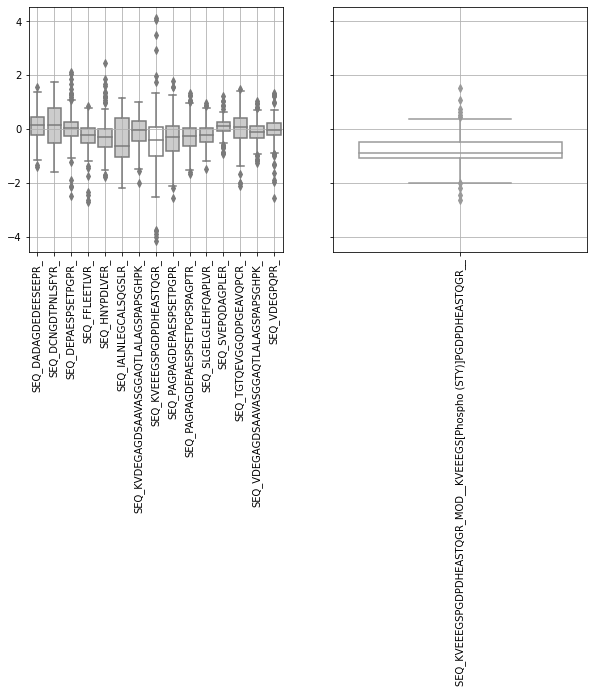

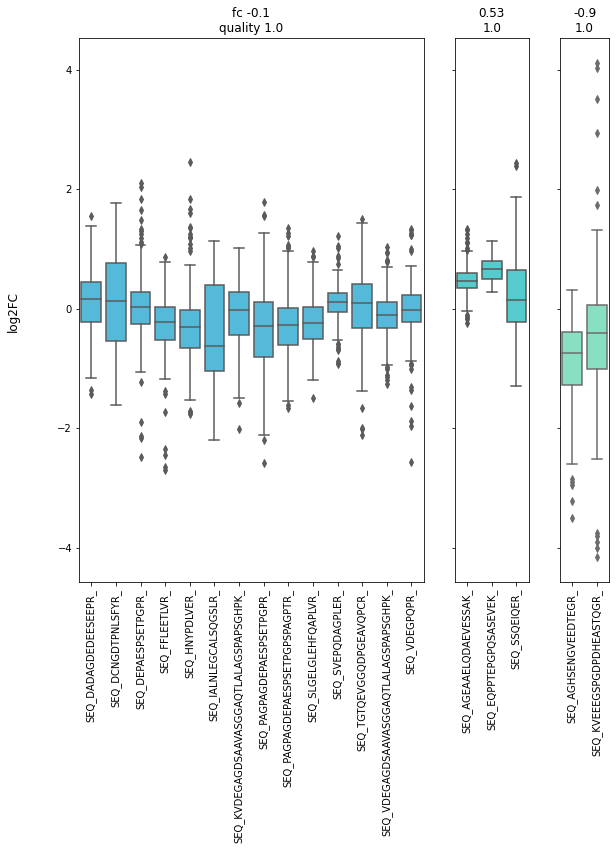

SEQ_SASAPAAEGEGTPTQPASEK_
P35659
outlier fc 1.4555675443808942
modified fc 1.9195624396888946


outlier protnormed 1.4505064868701847
modified protnormed 1.914501382178185
False


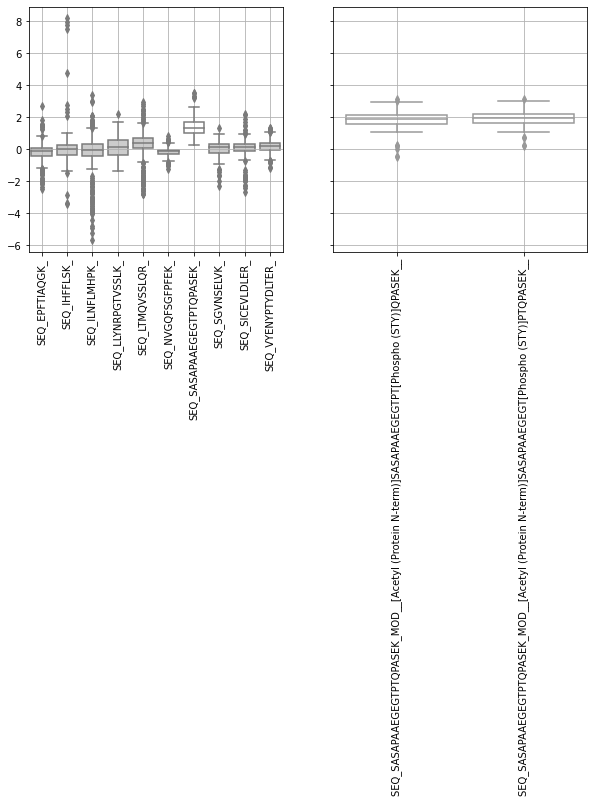

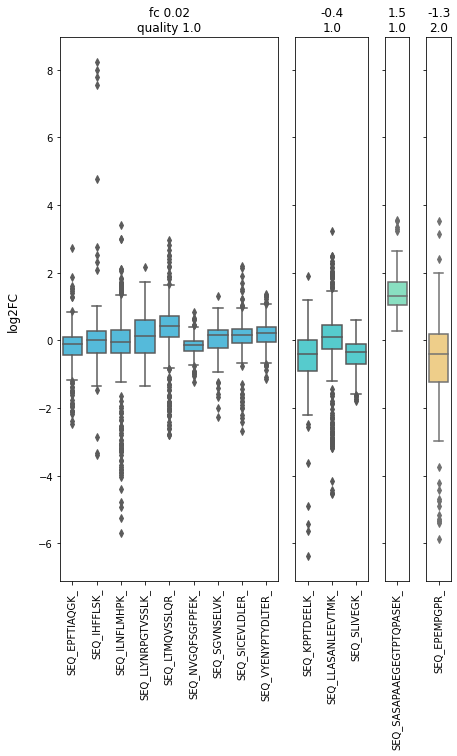

SEQ_TEGDEEAEEEQEENLEASGDYK_
P12956
outlier fc 1.1444933262788508
modified fc 1.4665600378388355


outlier protnormed 1.200149543206323
modified protnormed 1.5222162547663076
False


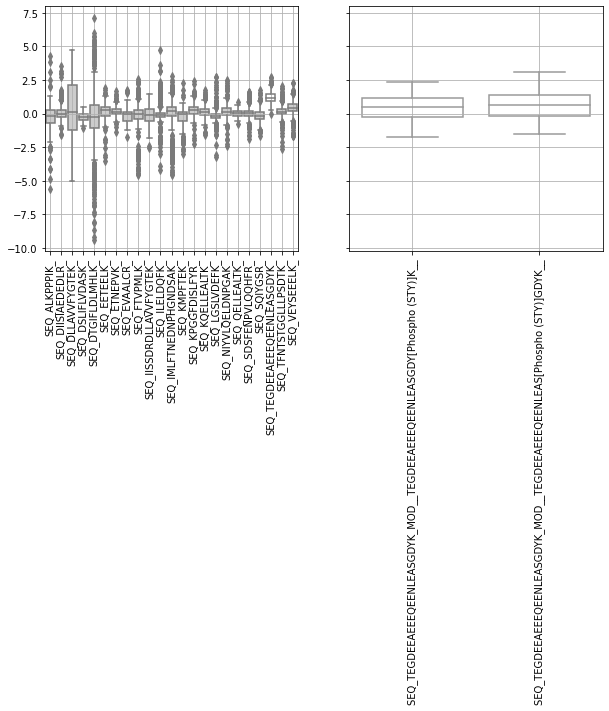

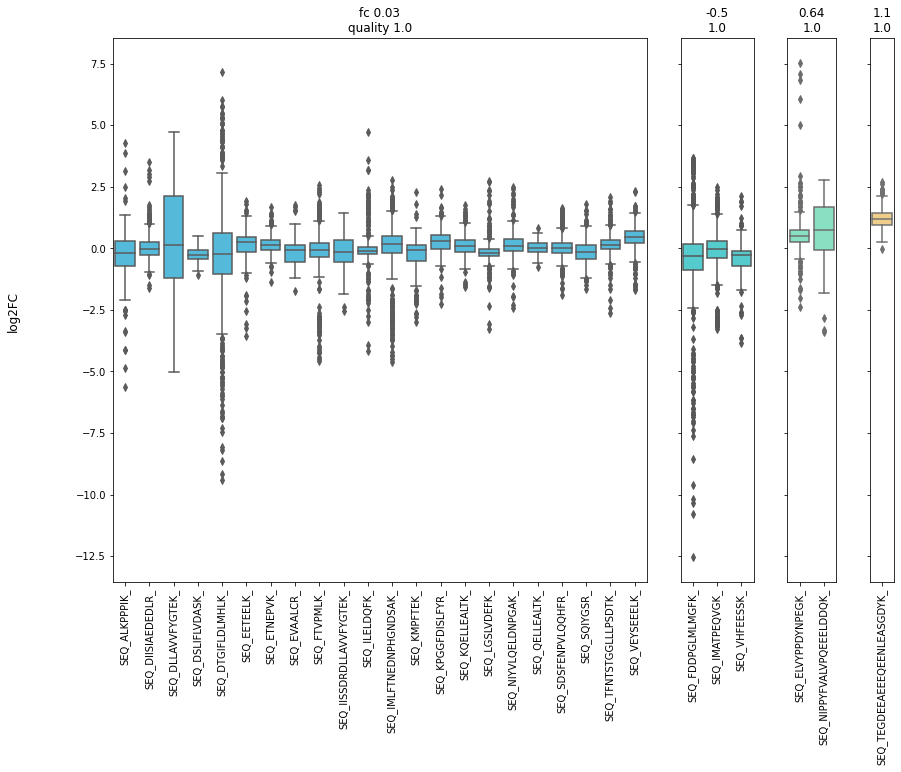

SEQ_EFSFEAWNAK_
P78347;P78347-2;P78347-3;P78347-4
outlier fc -0.9093665815545176
modified fc -2.670896327619659


outlier protnormed -0.9235193990070886
modified protnormed -2.68504914507223
False


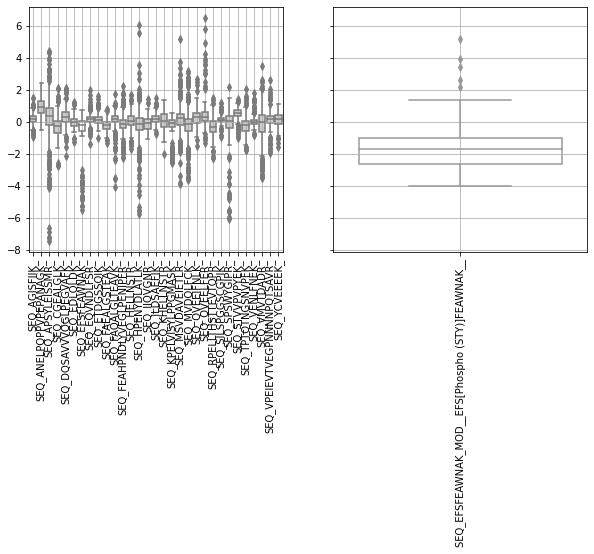

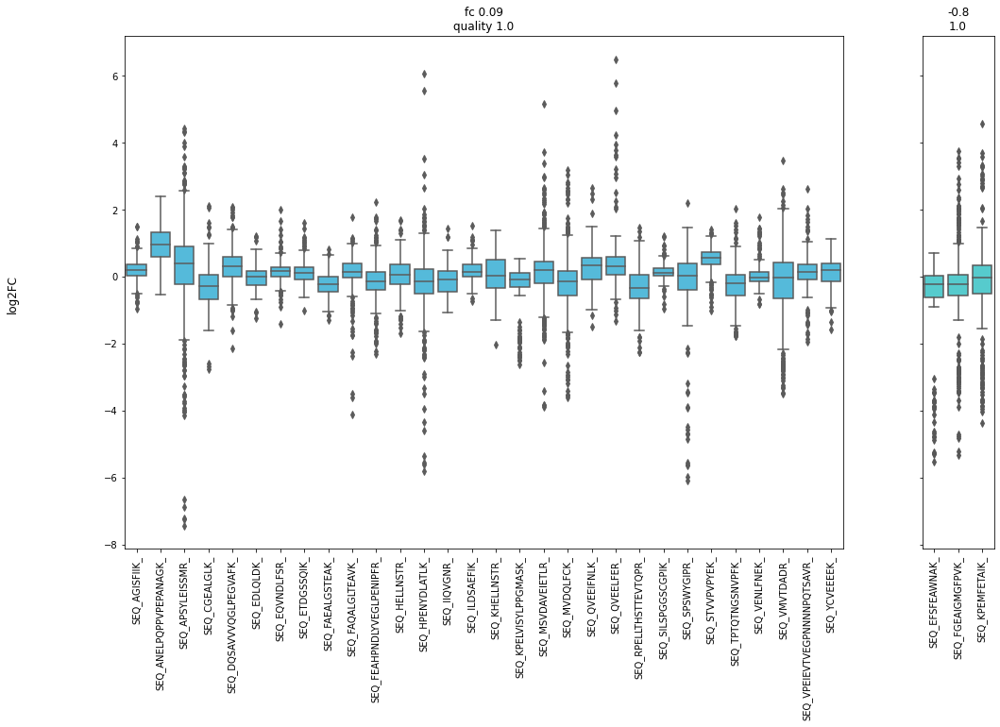

SEQ_QNPEQSADEDAEK_
Q99613
outlier fc 0.8586869217049447
modified fc 0.8972246681676854


outlier protnormed 0.8937260945440765
modified protnormed 0.9322638410068173
False


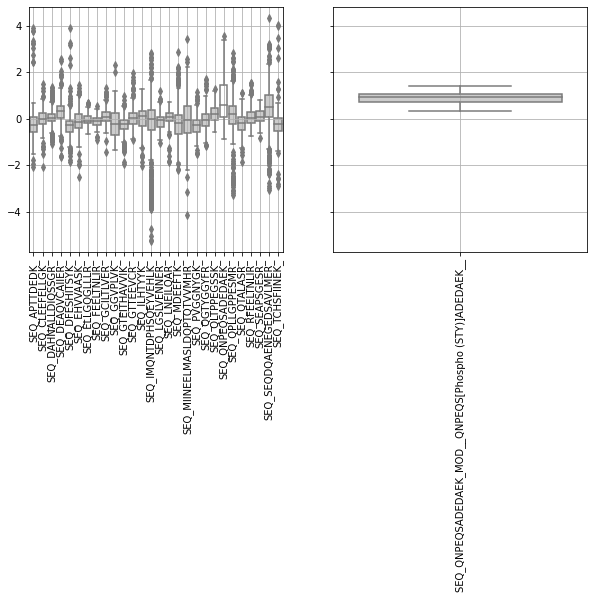

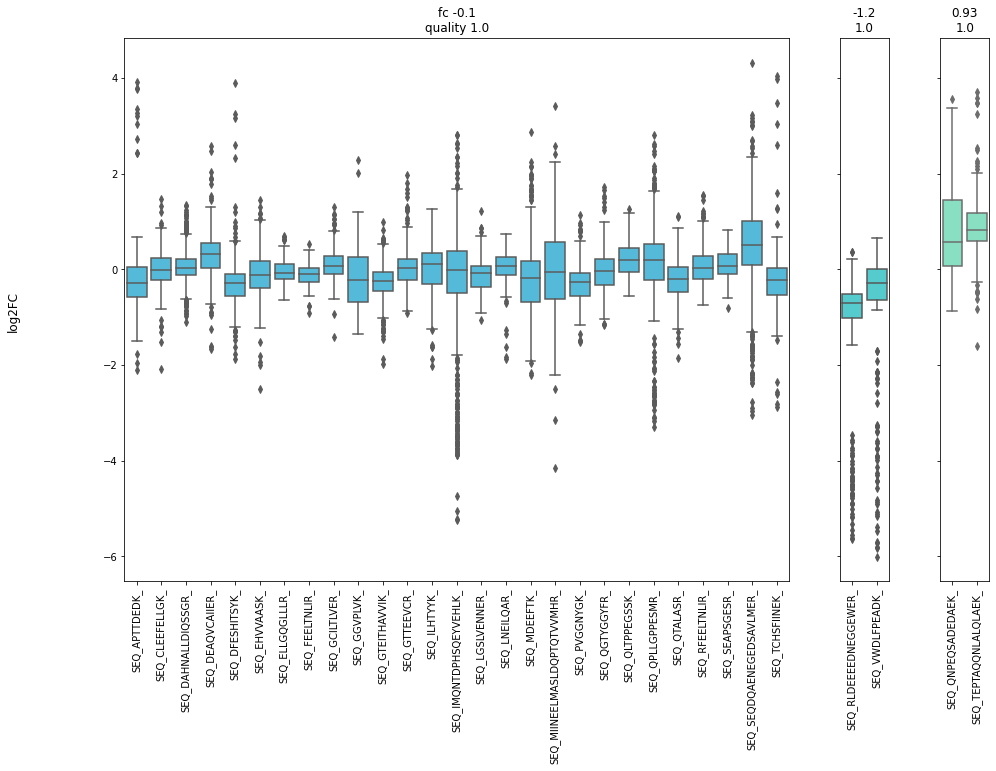

SEQ_IDVLLQQIEELGSEGK_
J3KPP4;O95232
outlier fc 1.4331269028571219
modified fc 0.7311935850450036


outlier protnormed 1.5530724687002357
modified protnormed 0.8511391508881175
False


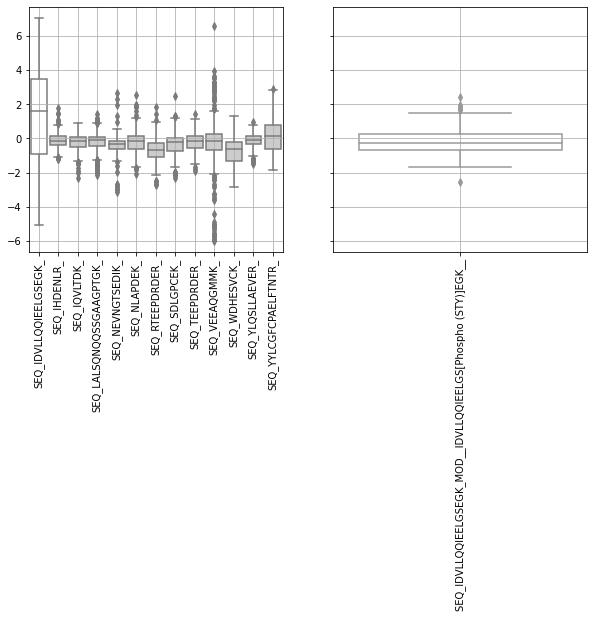

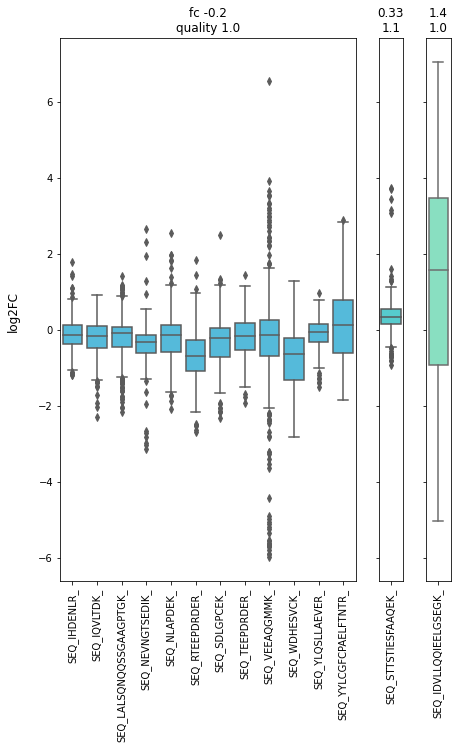

SEQ_TPTPSTPGDTQPNTPAPVPPAEDGIK_
A0A0C4DGG9;F5GWX5;Q14839;Q14839-2
outlier fc 2.584574803771785
modified fc 0.8857661180309178


outlier protnormed 2.6439514126644816
modified protnormed 0.9451427269236143
False


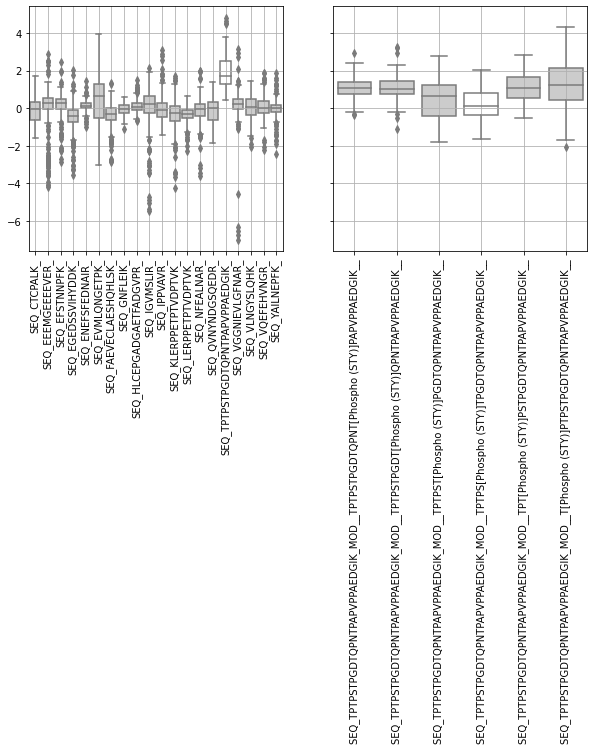

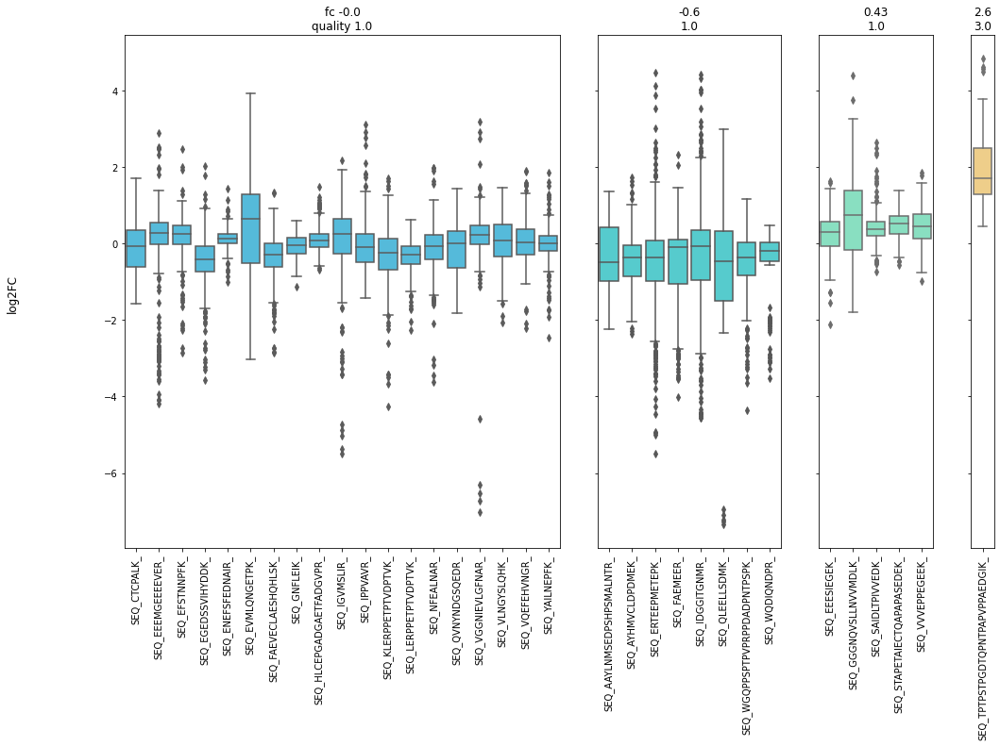

SEQ_QNSPVAPTAQPK_
Q6P1N0
outlier fc 0.7583124713537148
modified fc 1.2548398046895615


outlier protnormed 0.7874217008977843
modified protnormed 1.283949034233631
False


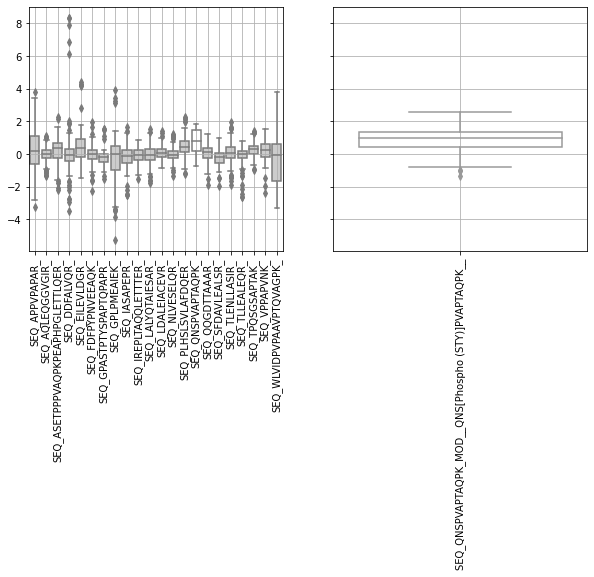

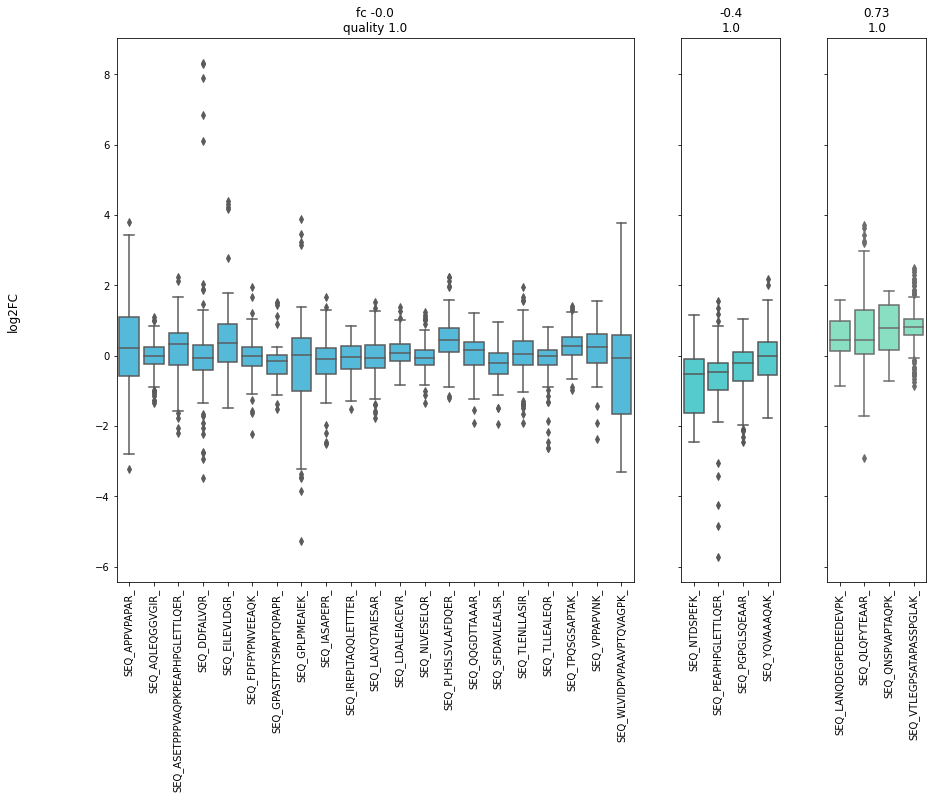

SEQ_SGEDEQQEQTIAEDLVVTK_
Q9UQ80
outlier fc 0.9136668181307186
modified fc 0.8700571006014248


outlier protnormed 0.9609600279431492
modified protnormed 0.9173503104138554
False


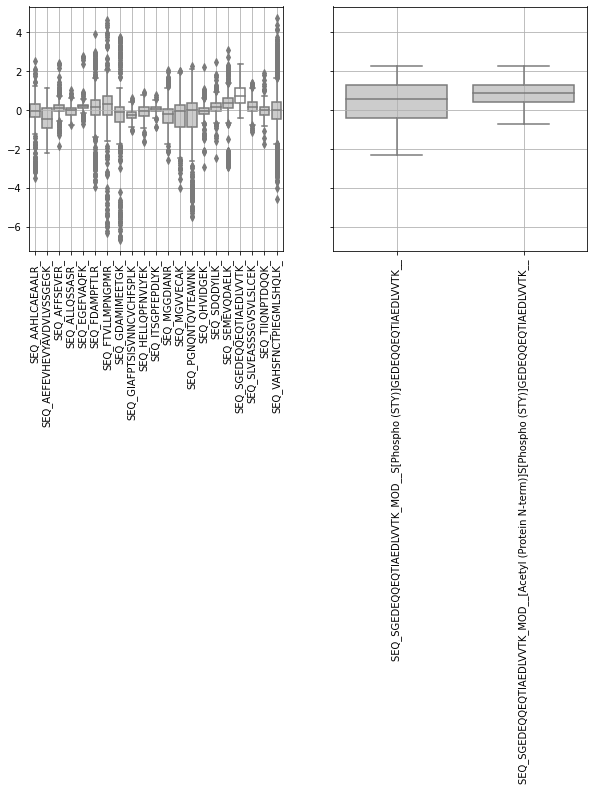

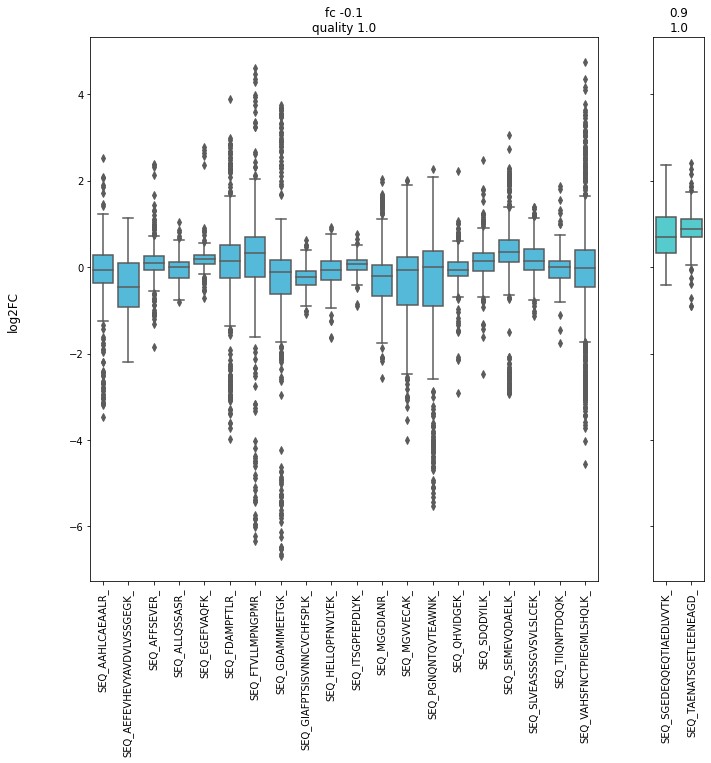

SEQ_QPETVLTETPQDTIELNR_
P30260;P30260-2
outlier fc 1.0413989895479454
modified fc 1.0215800277008993


outlier protnormed 1.0375475260455382
modified protnormed 1.0177285641984921
False


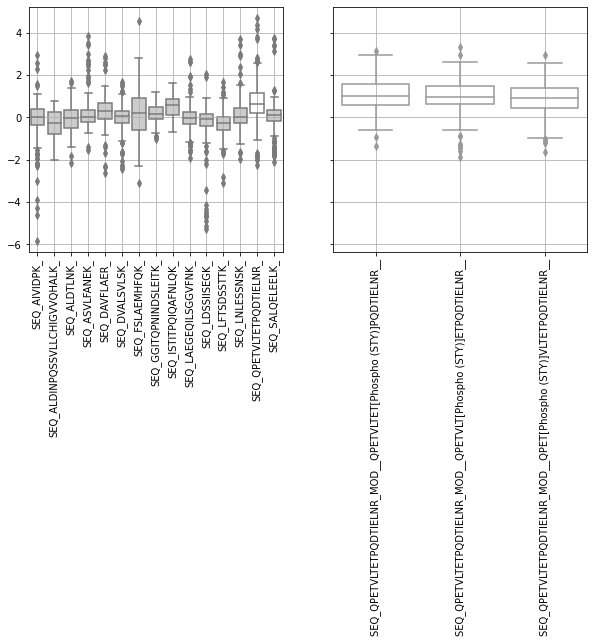

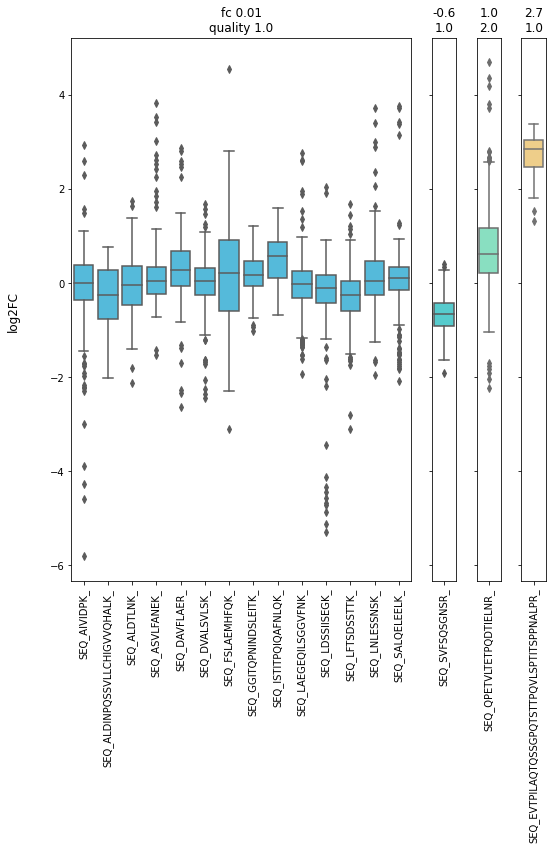

SEQ_SAVVAAGGGSSGQVTSNGSIGR_
O96005
outlier fc -0.7307934054747349
modified fc -1.482434965155876


outlier protnormed -0.7505481029061327
modified protnormed -1.5021896625872737
False


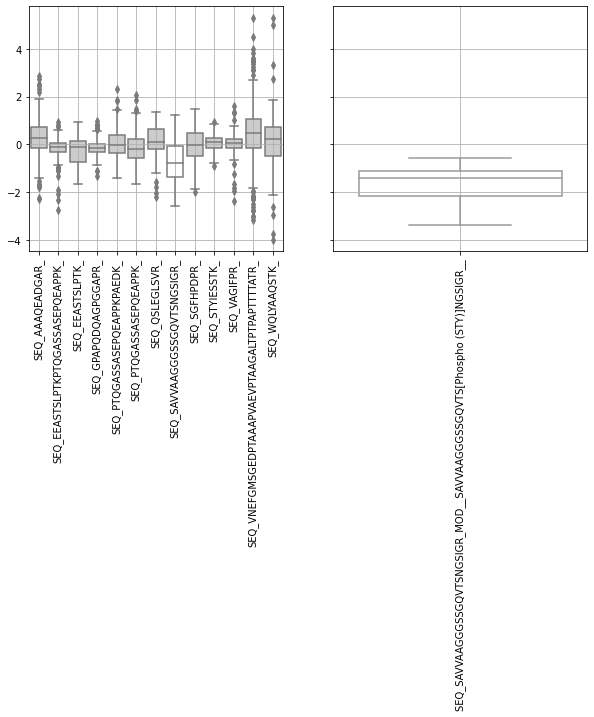

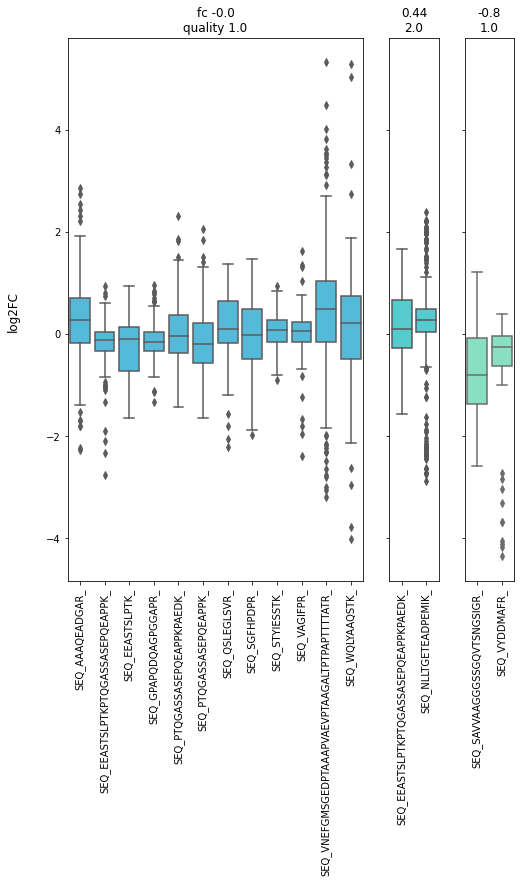

SEQ_TGSNISGASSDISLDEQYK_
P22059
outlier fc 1.0960249634770305
modified fc 0.832310514885722


outlier protnormed 1.0843028273454463
modified protnormed 0.8205883787541378
False


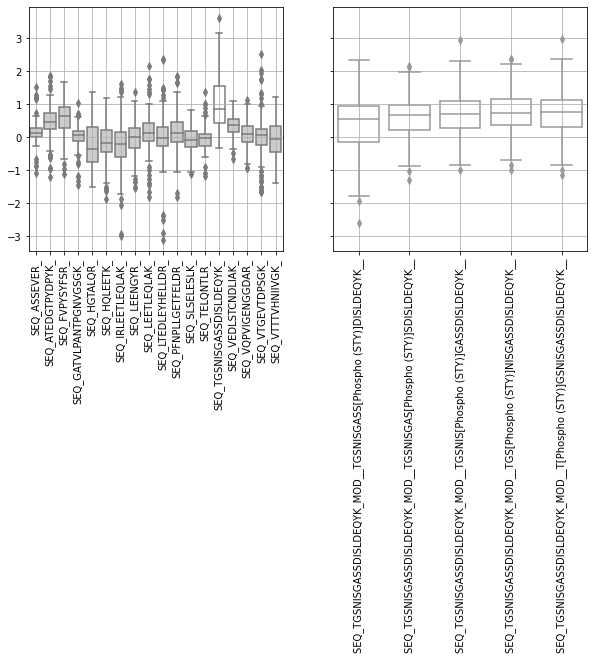

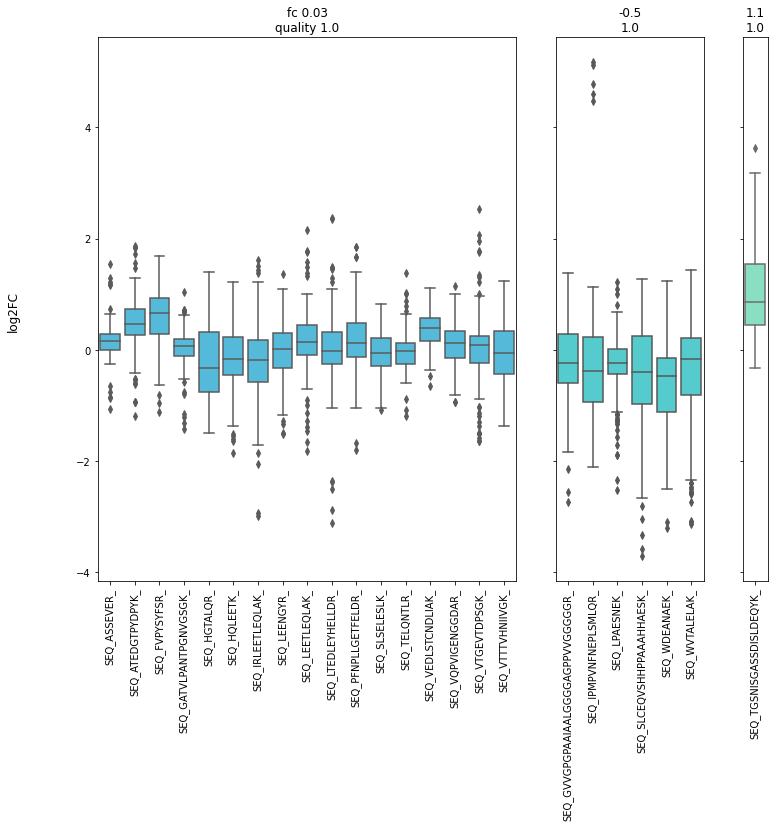

SEQ_EPIWETLSEEK_
P82664
outlier fc -0.9183600628514634
modified fc -0.6611597100612414


outlier protnormed -1.2245504752746412
modified protnormed -0.9673501224844192
False


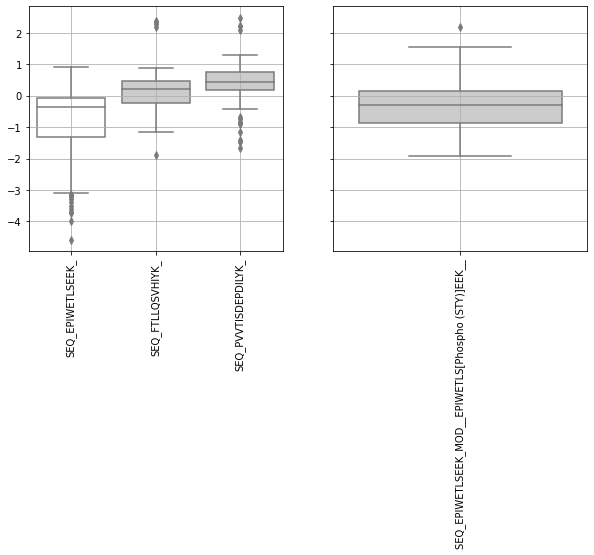

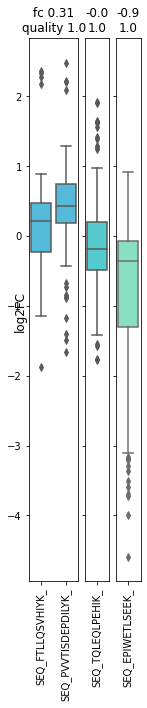

SEQ_SSQPSPTAVPASDSPPTK_
Q3KQU3
outlier fc 1.7516301404028876
modified fc 1.2355878819568755


outlier protnormed 1.5298111071581546
modified protnormed 1.0137688487121426
False


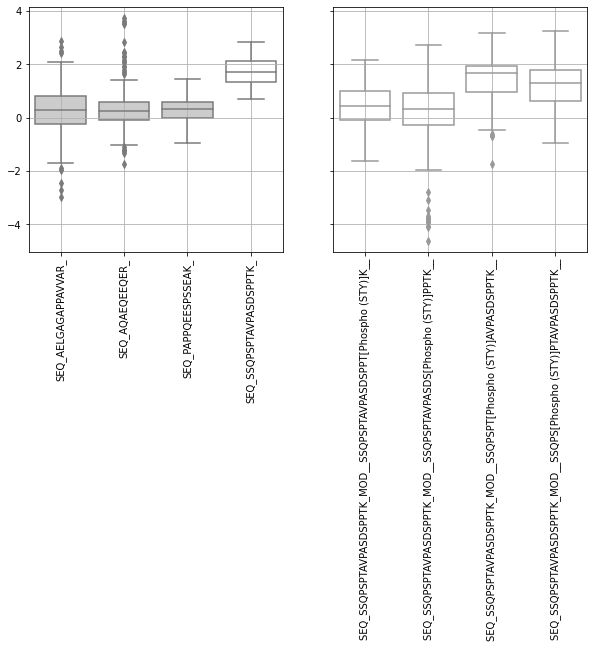

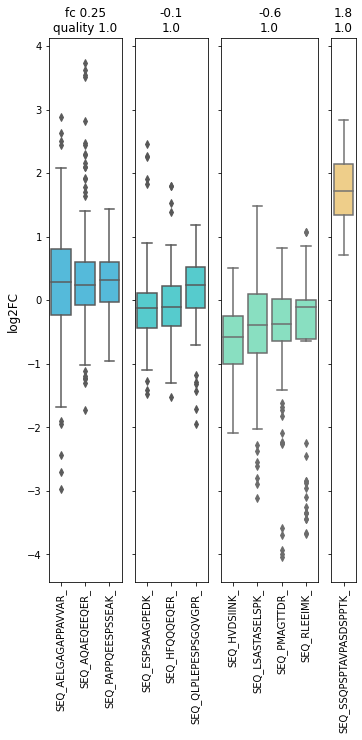

SEQ_DVEMGNSVIEENEMK_
P43003;P43003-2
outlier fc 0.425798154665323
modified fc 0.3871491986383179


outlier protnormed 0.9813170318020779
modified protnormed 0.9426680757750727
False


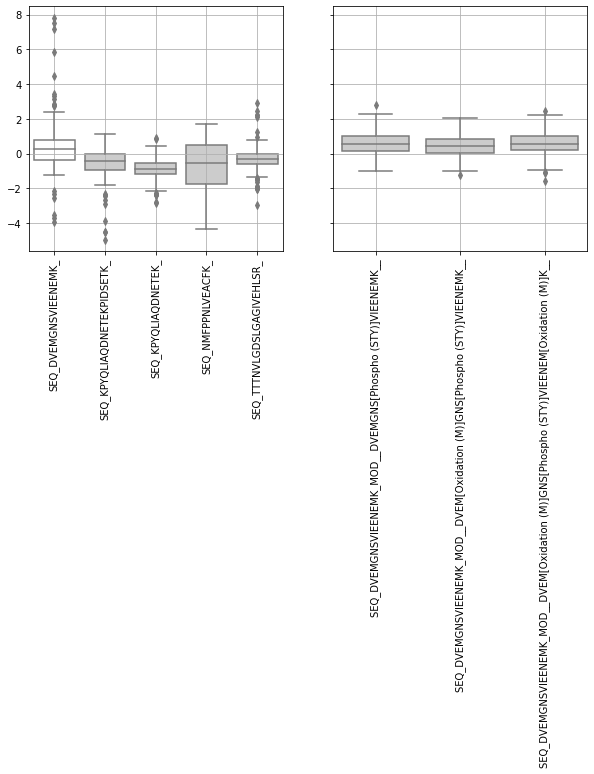

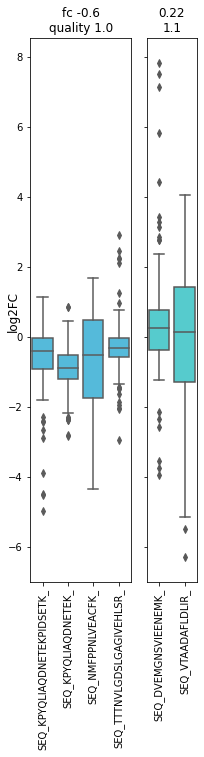

SEQ_EVDEDSEPER_
Q53GS9
outlier fc 0.935670978264035
modified fc 0.5013613067750589


outlier protnormed 1.471074115111214
modified protnormed 1.036764443622238
False


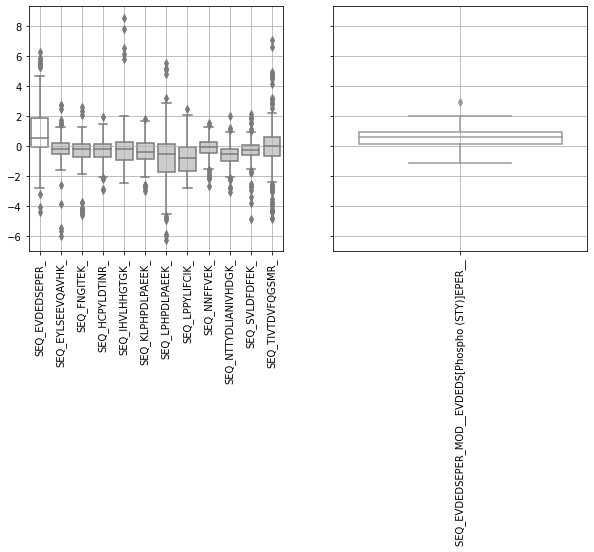

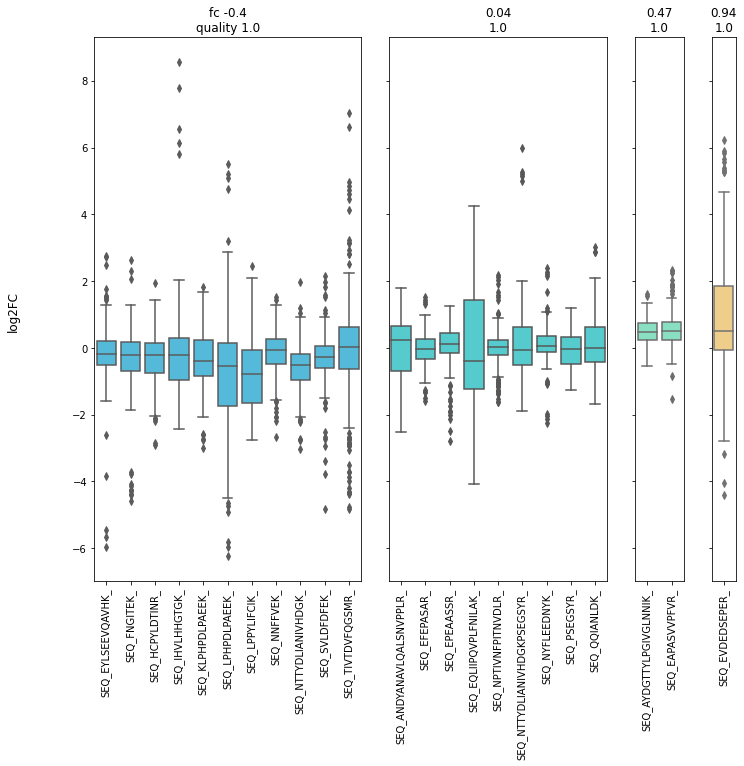

SEQ_AQLENHEPEEEEEEEMETEEK_
Q8N7H5-3
outlier fc -1.1707149909004357
modified fc -1.0203508381725426


outlier protnormed -1.1814254461768265
modified protnormed -1.0310612934489334
False


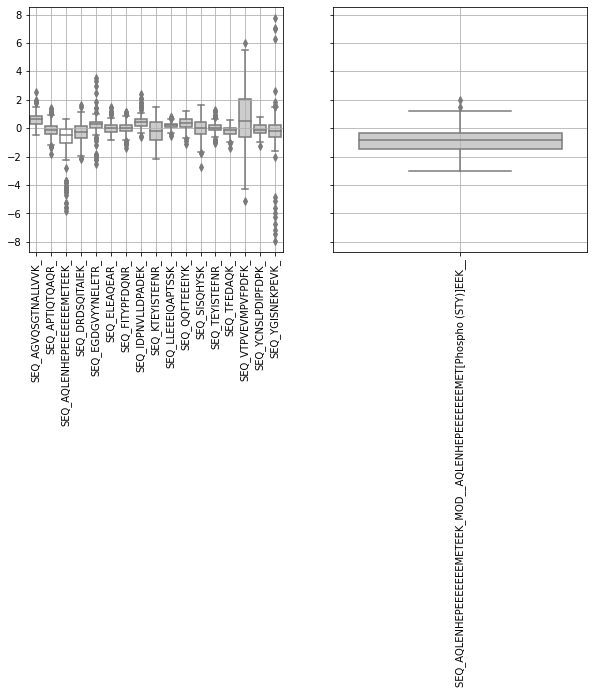

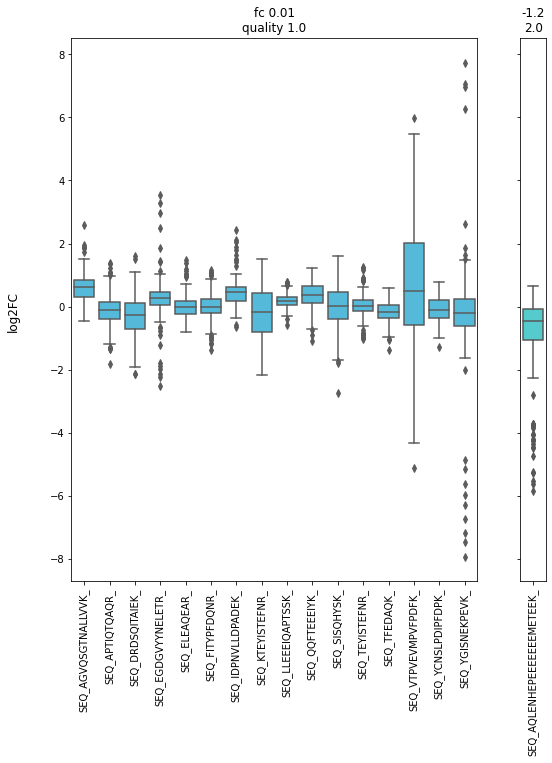

SEQ_LHNENAEMDSDSSSSGTETDLHGSLR_
Q9H832
outlier fc -1.3611077294035088
modified fc -1.2834754279833227


outlier protnormed -1.3597831582862427
modified protnormed -1.2821508568660567
False


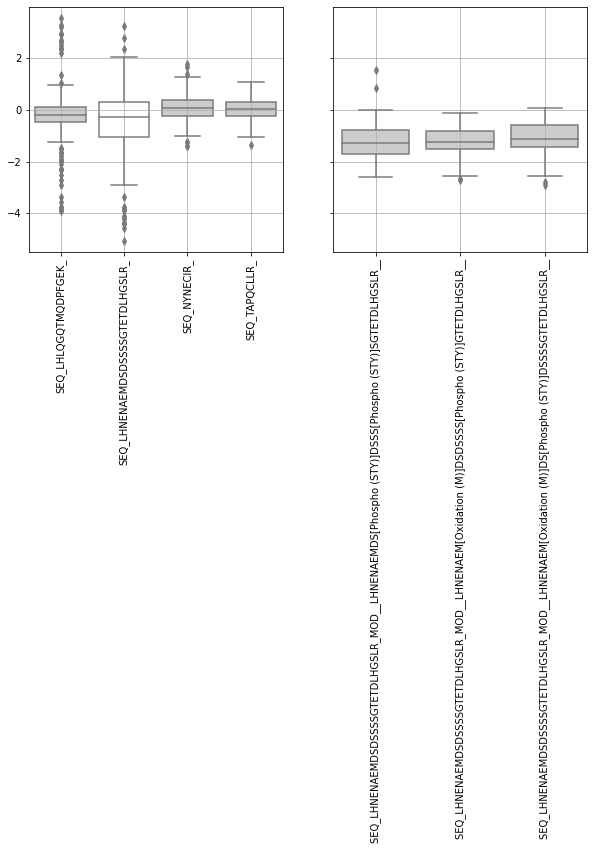

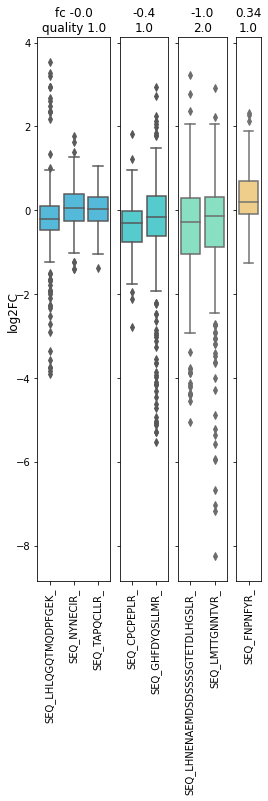

SEQ_PVGSLAGIGEVLGK_
O75531
outlier fc 0.11396965527552527
modified fc 1.268813769829364


outlier protnormed 0.8378081832935264
modified protnormed 1.992652297847365
False


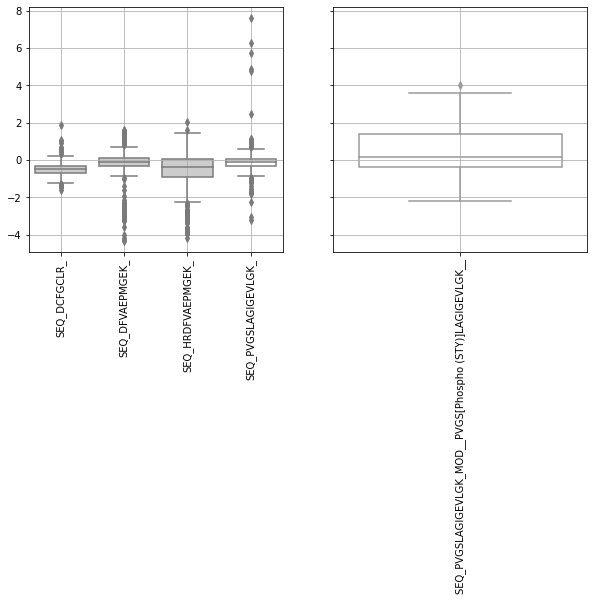

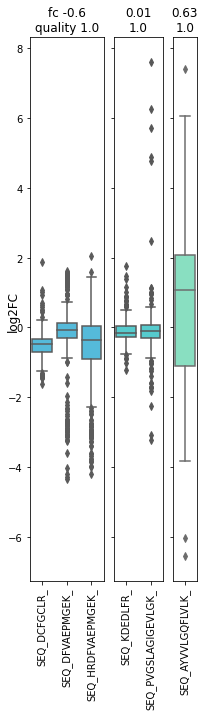

SEQ_LESFLHDSWR_
Q6DKI1
outlier fc -1.1458075420256666
modified fc -1.5591450371404092


outlier protnormed -1.208707980432571
modified protnormed -1.6220454755473137
False


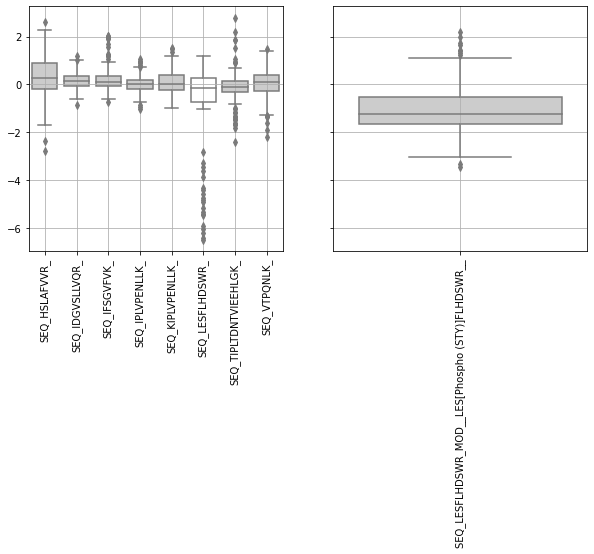

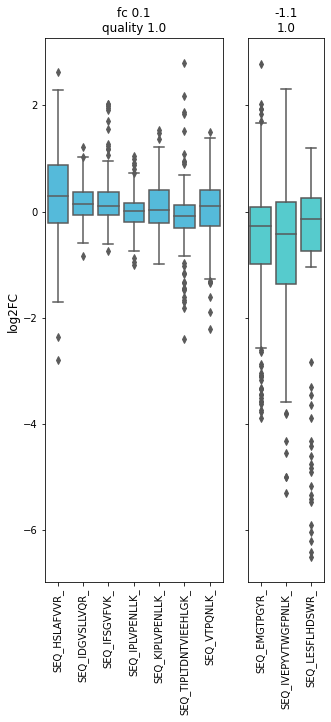

SEQ_ISASGPESLLGGPGGASAAPAAGSK_
Q9Y2U8
outlier fc -0.7684183131554191
modified fc -0.7587061248616027


outlier protnormed -0.8456210467498474
modified protnormed -0.835908858456031
False


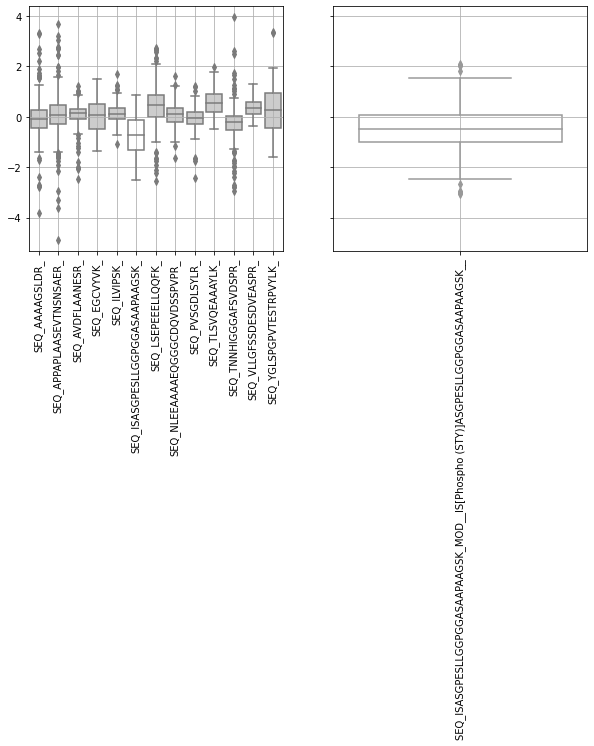

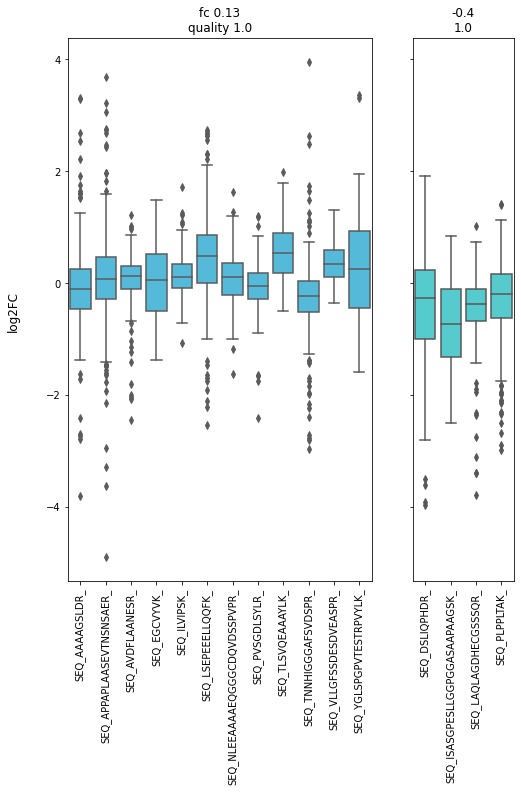

SEQ_SGGSGGCSGAGGASNCGTGSGR_
A0A087WUC6;E9PI68;Q15005
outlier fc -0.5174793592644651
modified fc -0.8597475039293807


outlier protnormed -0.8252219030859752
modified protnormed -1.1674900477508907
False


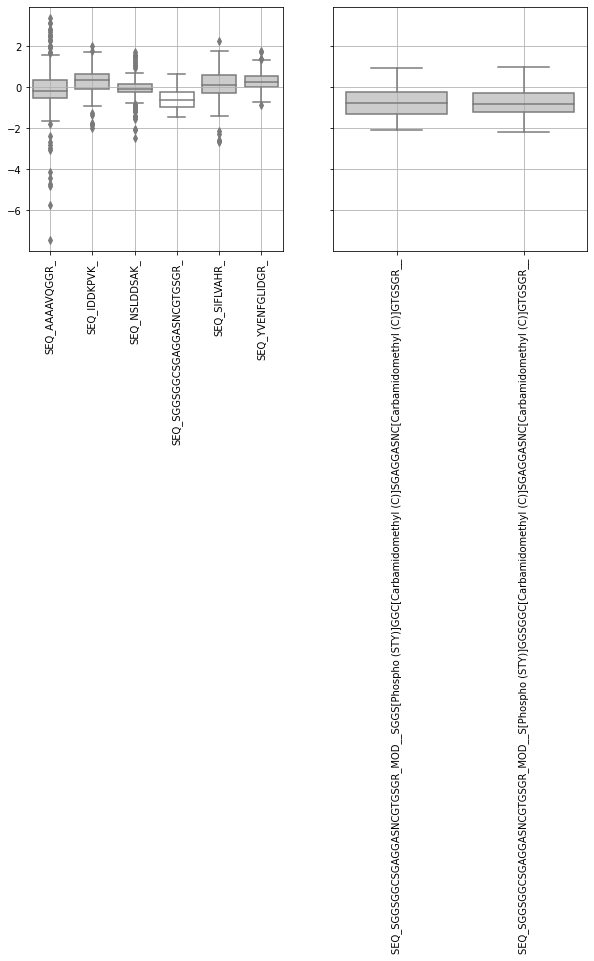

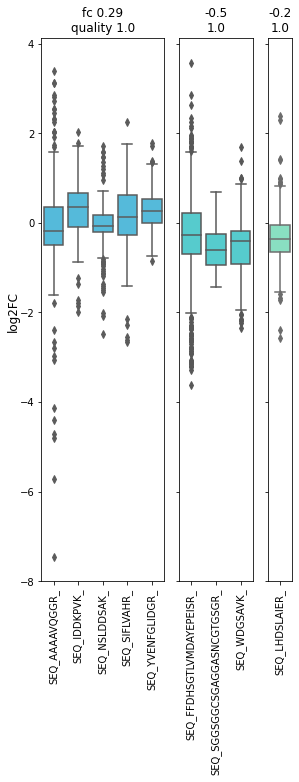

SEQ_TLDAEVVEK_
A0A0C4DFX9;Q9H3P2
outlier fc -0.8732974680486003
modified fc -2.6775481867759034


outlier protnormed -0.915850871212488
modified protnormed -2.720101589939791
False


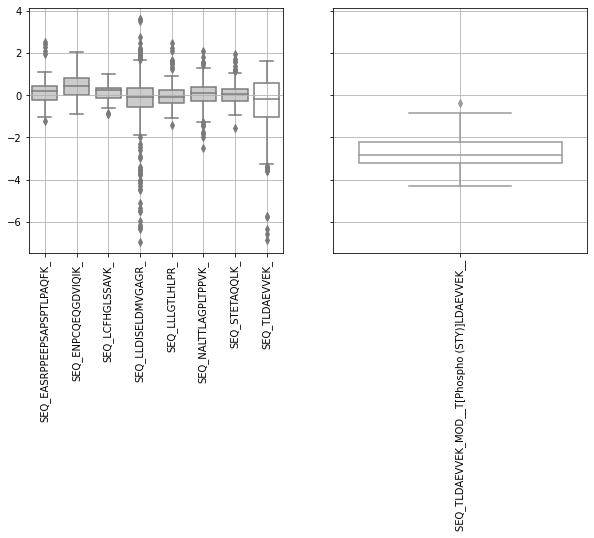

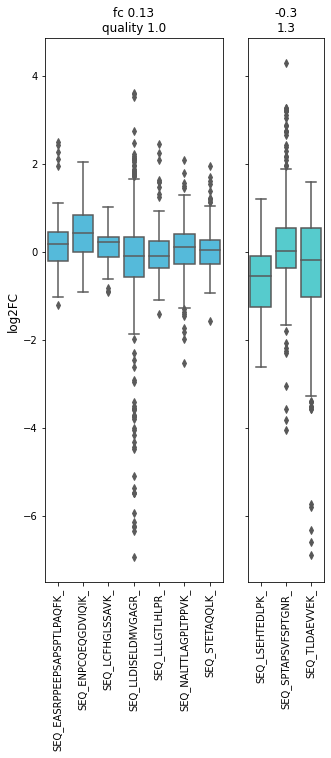

SEQ_ERDSELSDTDSGCCLGQSESDK_
A0A087WTW0;A0A087WVR3;Q96T88;Q96T88-2
outlier fc -0.9368093705394215
modified fc -1.239258907535279


outlier protnormed -1.0018084713891717
modified protnormed -1.304258008385029
False


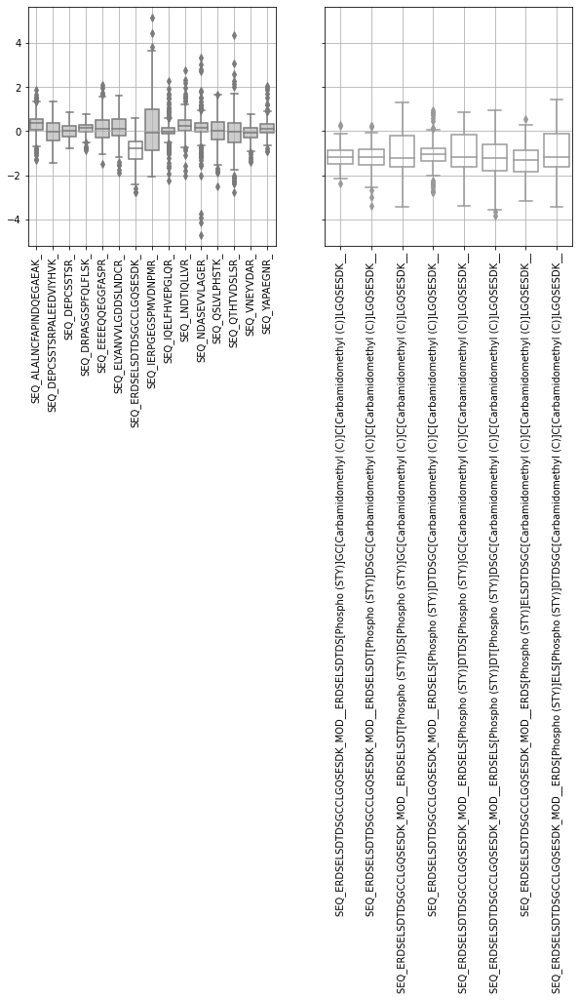

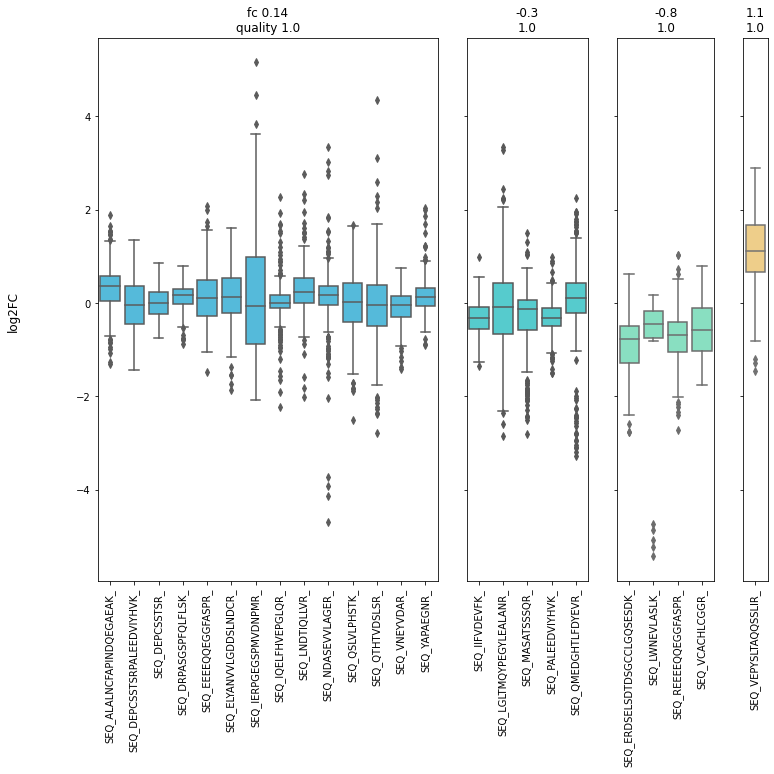

SEQ_TSSSSPANSDVEIDGIGR_
O60293
outlier fc 0.7909516774006902
modified fc 0.8948619370757838


outlier protnormed 0.7903198394508162
modified protnormed 0.8942300991259098
False


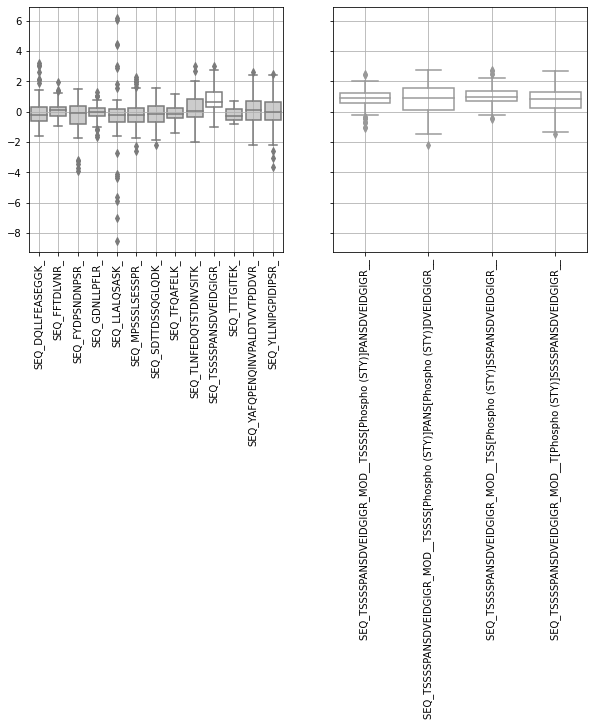

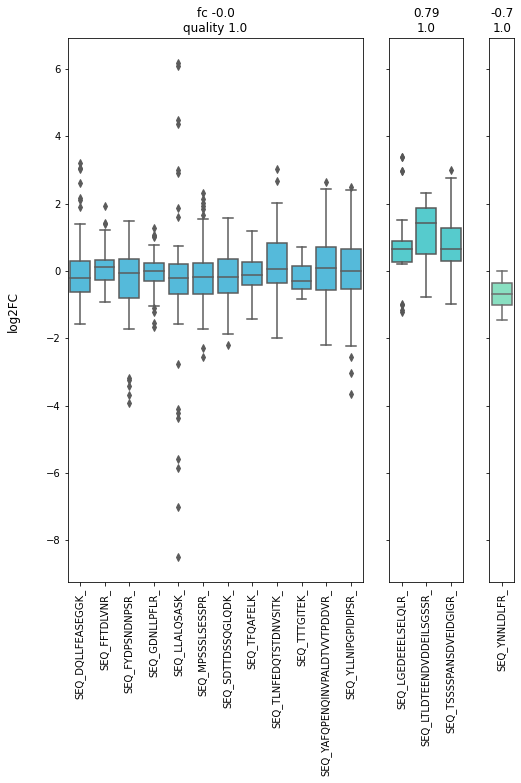

SEQ_PAPVAQPPAAAPPSAVGSSAAAPR_
Q9Y6H1
outlier fc 0.4955064290033083
modified fc 0.2760864046488162


outlier protnormed 0.995174759706301
modified protnormed 0.7757547353518088
False


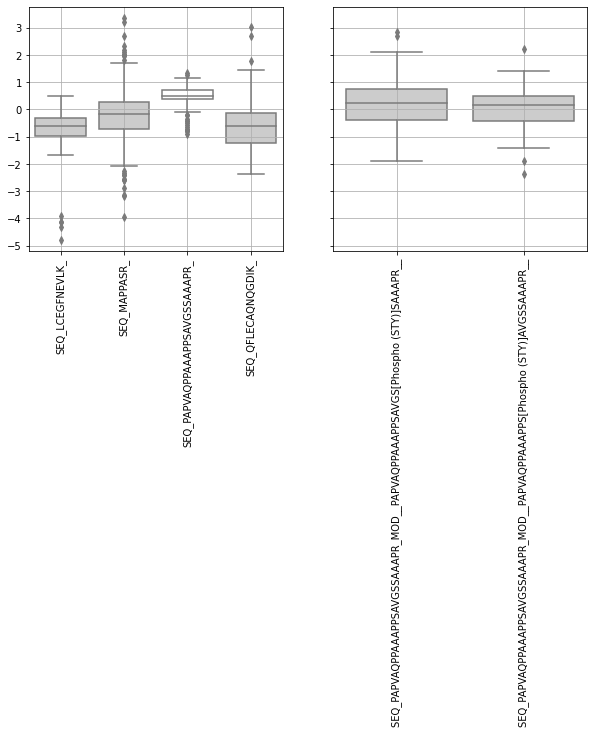

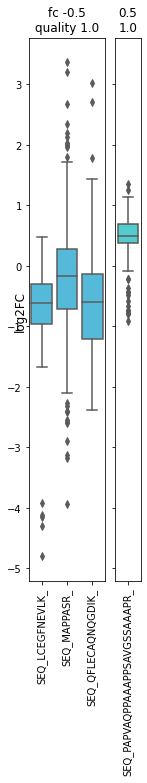

SEQ_LESLYSDEEDESAVGADK_
Q9UP95;Q9UP95-2
outlier fc 0.7876664479567569
modified fc 0.7410798159727747


outlier protnormed 0.9588128345945306
modified protnormed 0.9122262026105483
False


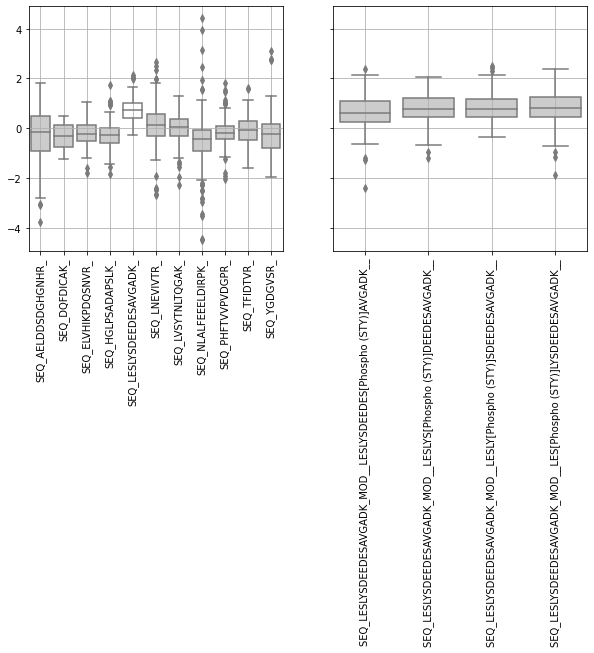

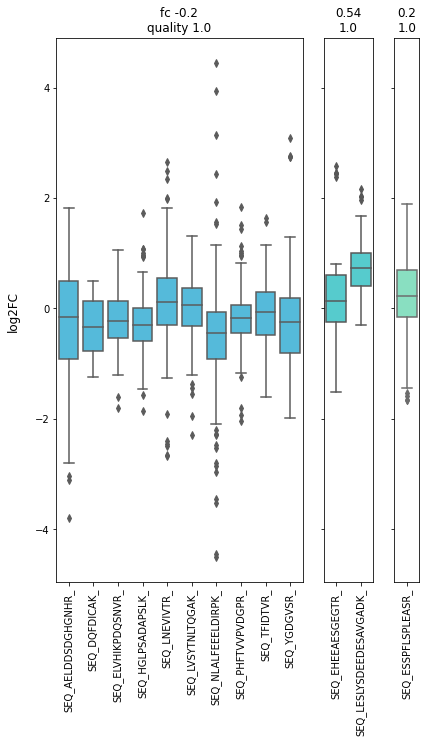

SEQ_QVAASPAVGQPLQK_
Q92547
outlier fc 0.7253719077439713
modified fc 0.6326903403220204


outlier protnormed 0.9130825394090649
modified protnormed 0.820400971987114
False


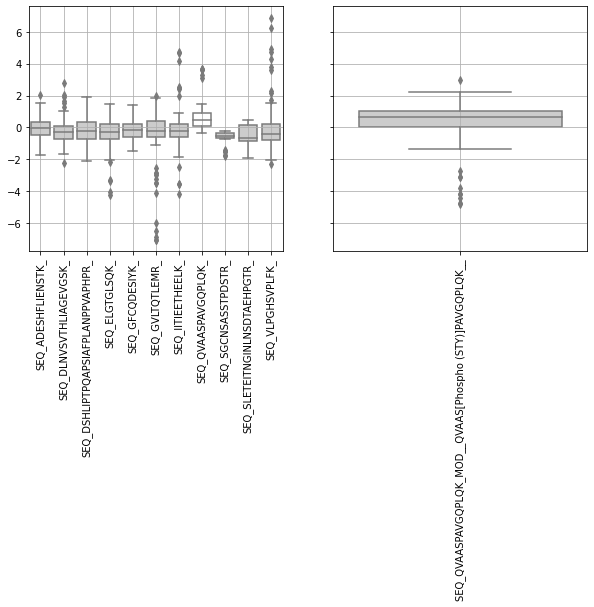

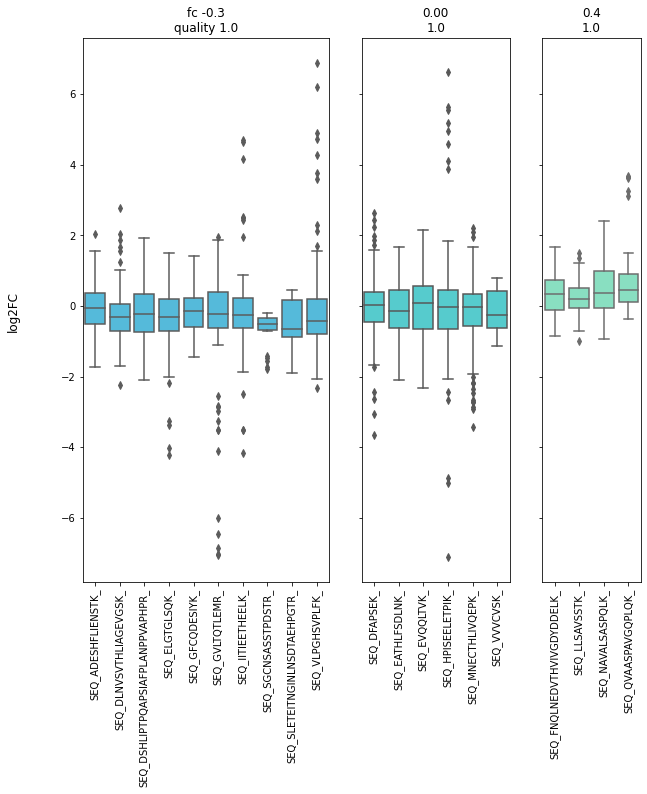

SEQ_QSVTSFPDADAFHHQVHDDDLLSSSEEECK_
P50402
outlier fc 1.2201765268573137
modified fc 1.9605055730162153


outlier protnormed 1.309723812099081
modified protnormed 2.0500528582579824
False


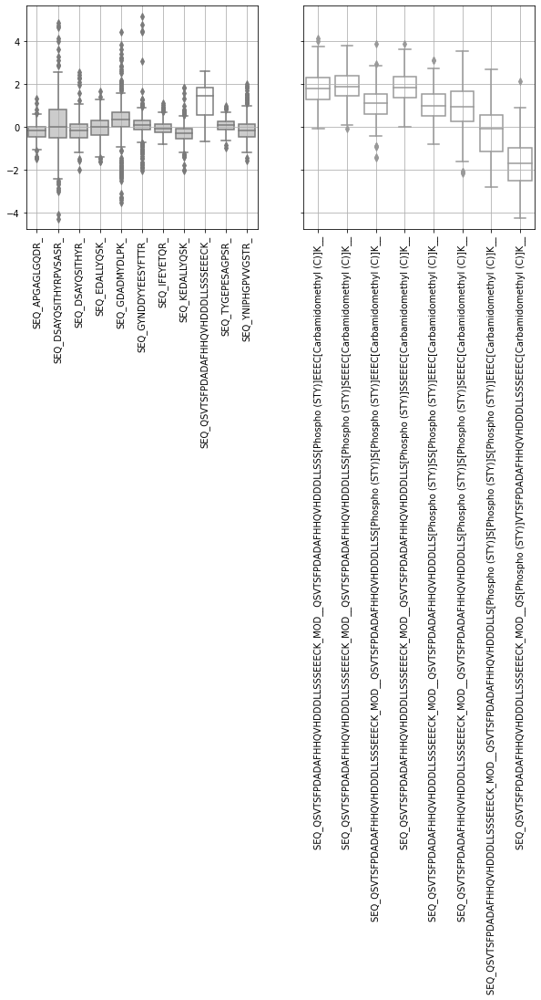

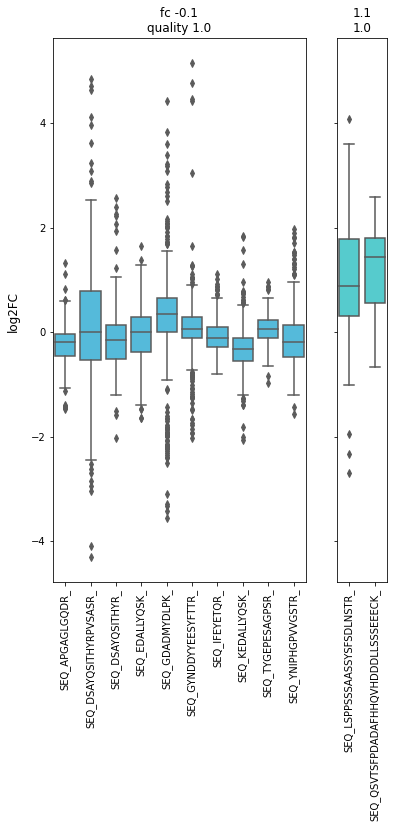

SEQ_SPSGGAAGPLLTPSQSLDGSR_
Q96CX2
outlier fc 0.8027738380650123
modified fc 0.8536030428906325


outlier protnormed 0.8257553732089516
modified protnormed 0.8765845780345718
False


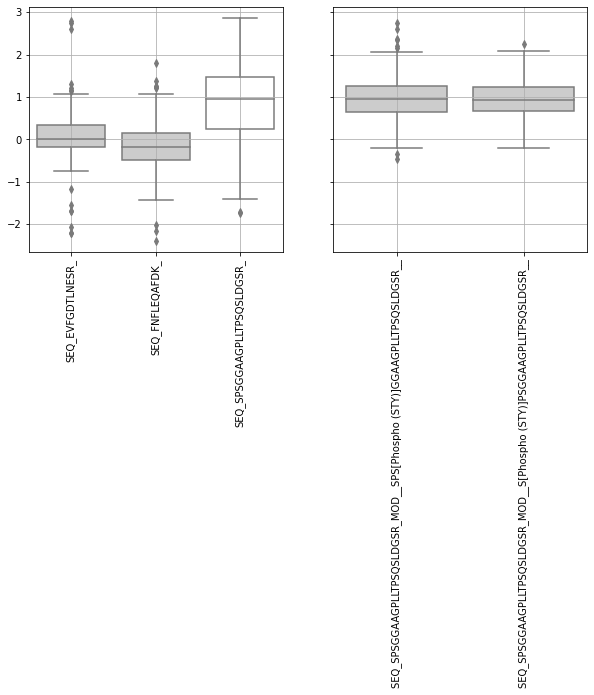

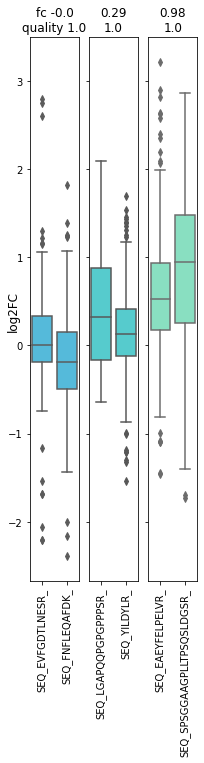

SEQ_FASENDLPEWK_
P43487;P43487-2
outlier fc -0.9902746998826696
modified fc -1.5725966485916305


outlier protnormed -0.9590967643298065
modified protnormed -1.5414187130387673
False


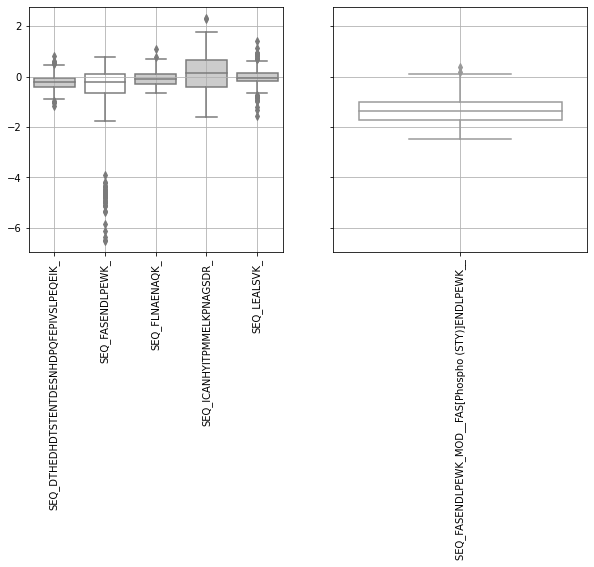

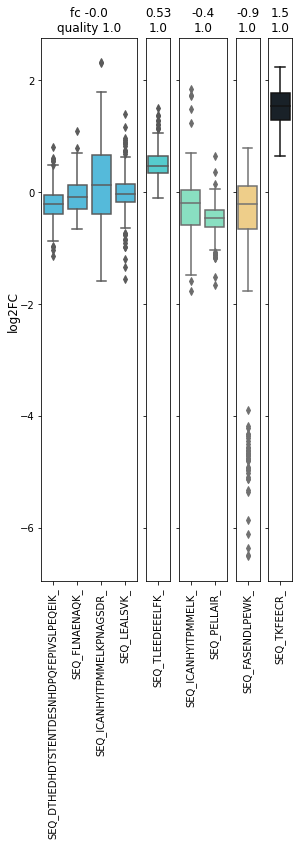

SEQ_HAPHCLSEEEGEQDRPR_
O75190
outlier fc -0.6767733693769216
modified fc -0.8926894885850786


outlier protnormed -0.8025076227168071
modified protnormed -1.018423741924964
False


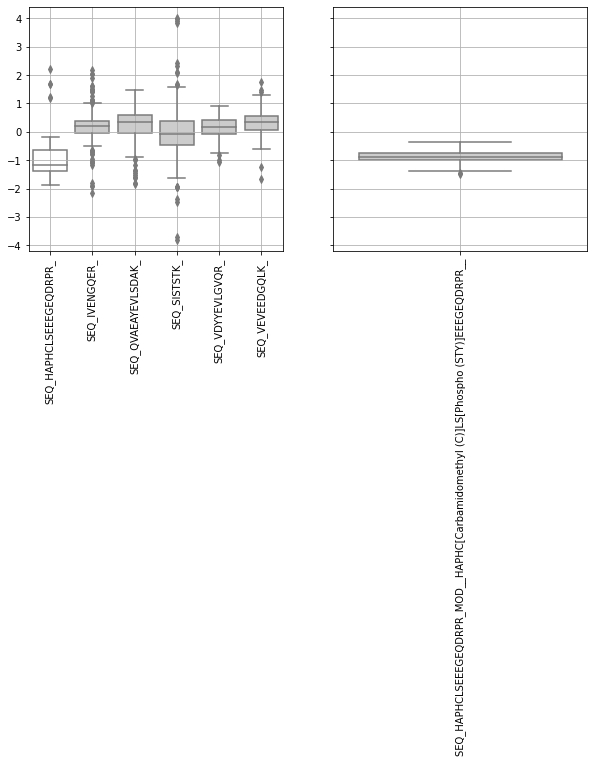

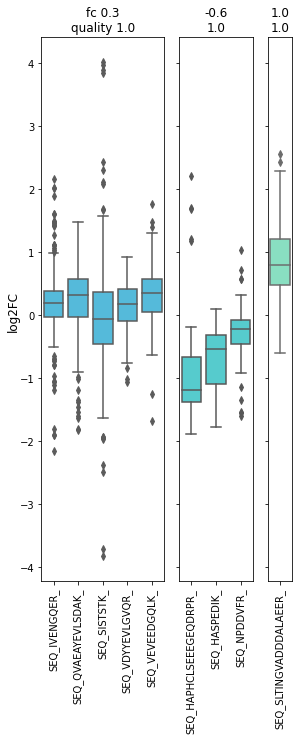

SEQ_FLEENSSDPTYTSSLGGK_
P54760;Q96L35
outlier fc 1.2313520502749222
modified fc 1.1938771032563582


outlier protnormed 1.3073017153788415
modified protnormed 1.2698267683602775
False


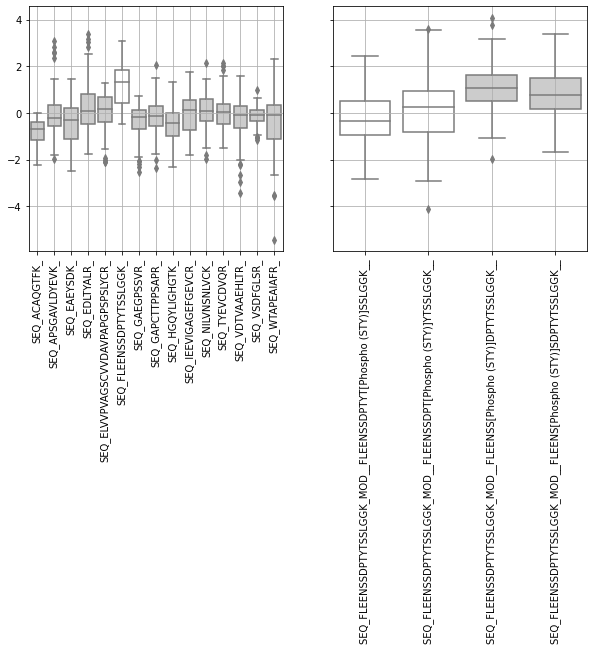

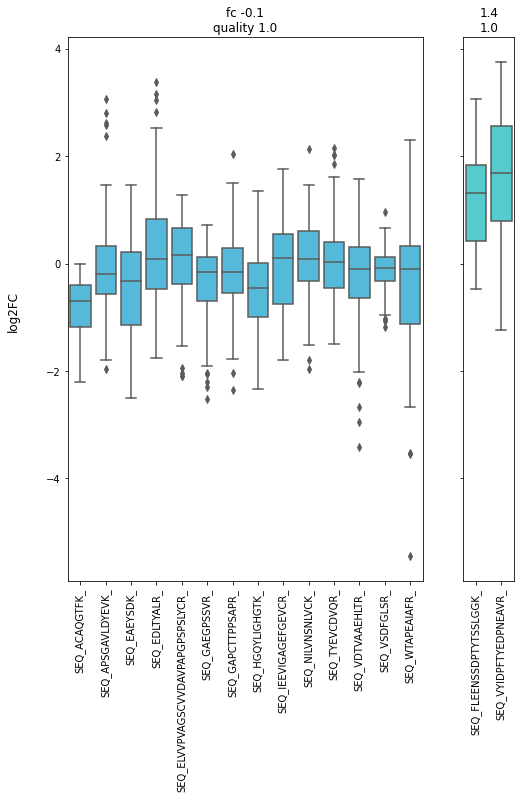

SEQ_AEPSAATQSHSISSSSFGAEPSAPGGGGSPGACPALGTK_
O95197;O95197-2
outlier fc 0.7138044741130218
modified fc 0.7331353897636894


outlier protnormed 0.7953093273854596
modified protnormed 0.8146402430361271
False


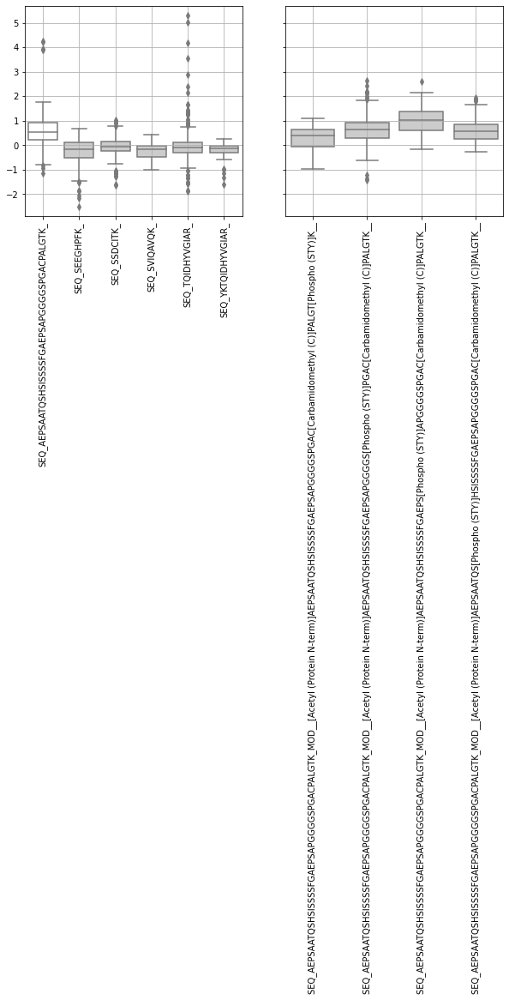

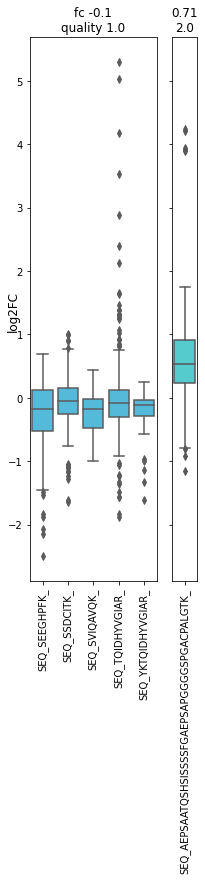

SEQ_ELQAEATVSGSPEAPGTNVVSEPR_
Q9BZV1;Q9BZV1-2
outlier fc 0.9248697131967998
modified fc 1.016355429416885


outlier protnormed 0.8967844446561778
modified protnormed 0.9882701608762631
False


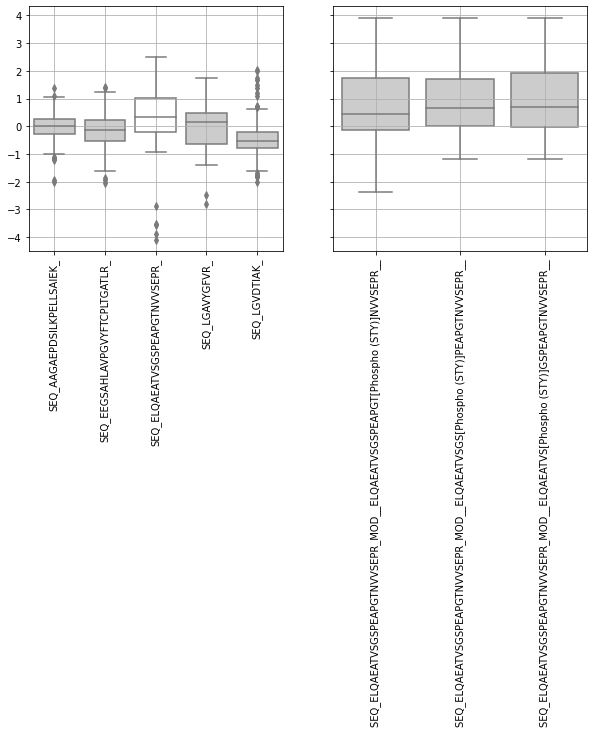

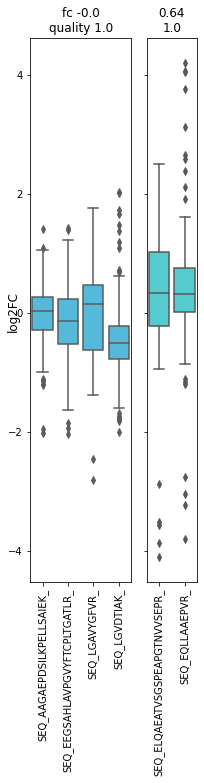

SEQ_AHSNPMADHTLR_
Q9UBP6
outlier fc -1.0333565445248447
modified fc -0.7438118054783439


outlier protnormed -1.2871051112795087
modified protnormed -0.997560372233008
False


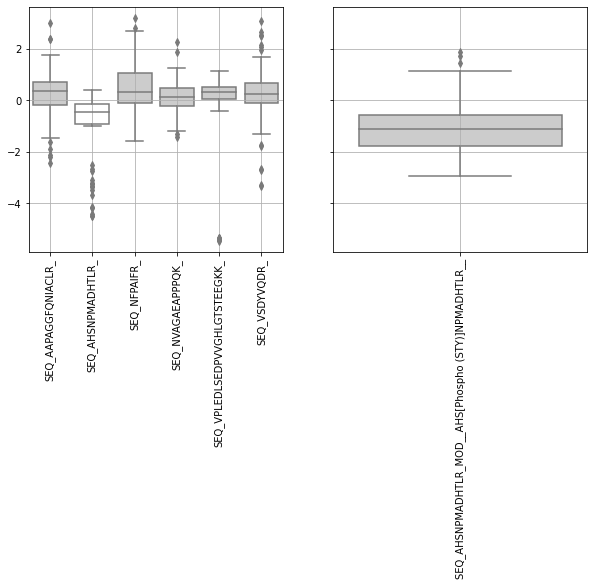

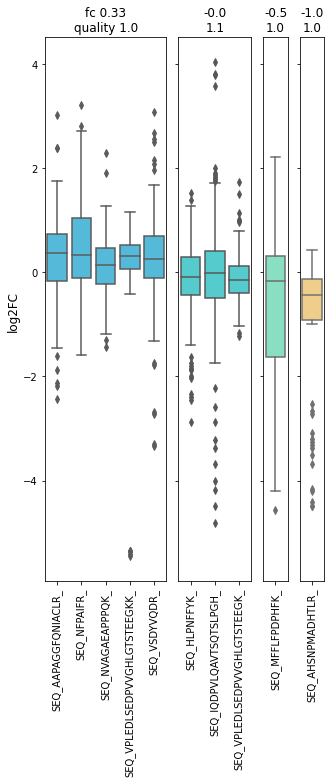

SEQ_HAGSCAGTPEEPPGGESAEEEENFV_
O95633;O95633-2
outlier fc 1.0763818149301292
modified fc 0.14779026309949073


outlier protnormed 1.7713248816308502
modified protnormed 0.8427333298002118
False


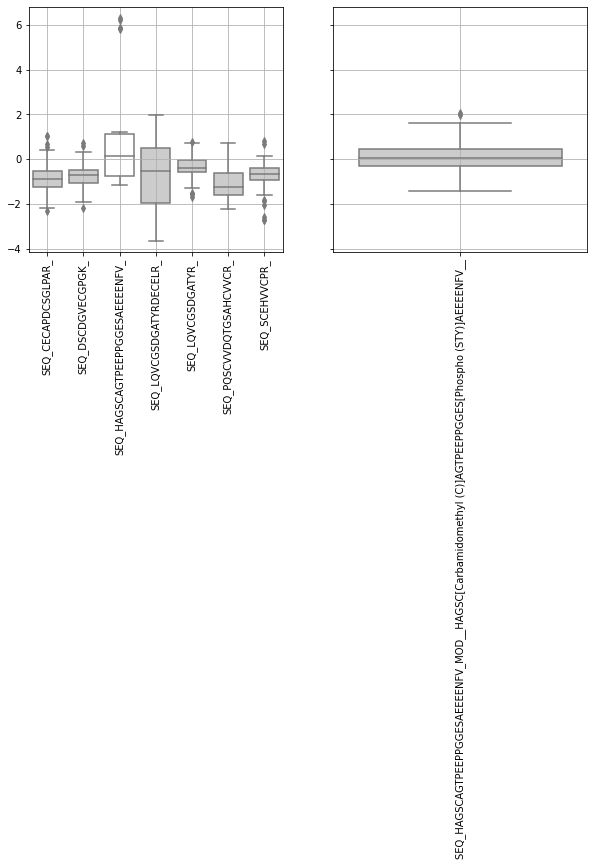

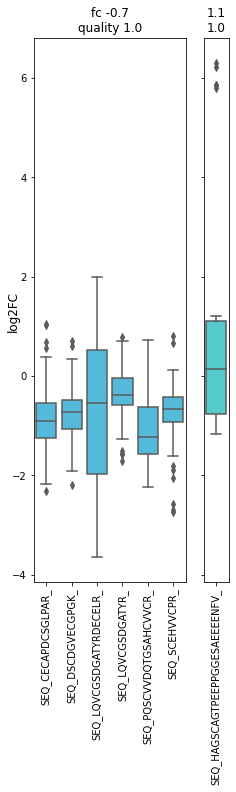

SEQ_SPSQDNTDSYFR_
Q9UJF2
outlier fc -1.1952225417255715
modified fc -1.661159968964172


outlier protnormed -1.206808439661107
modified protnormed -1.6727458668997075
False


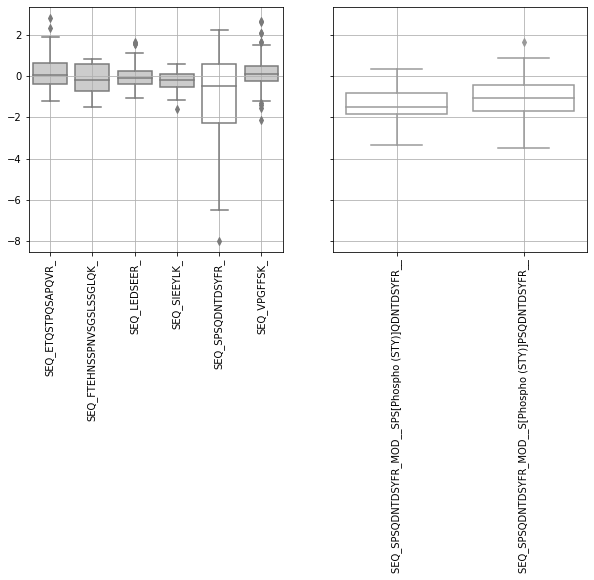

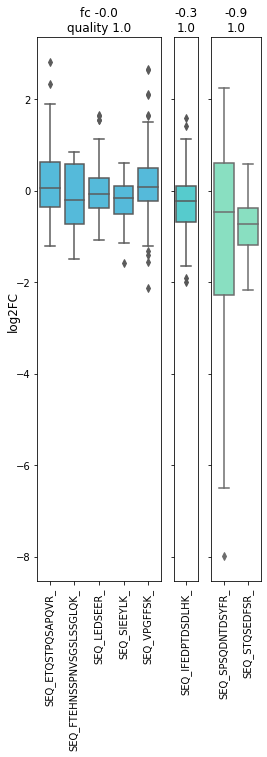

SEQ_SSGSETEQVVDFSDR_
O95251
outlier fc 0.7350624093011402
modified fc 0.761738347870635


outlier protnormed 0.8631352464819135
modified protnormed 0.8898111850514083
False


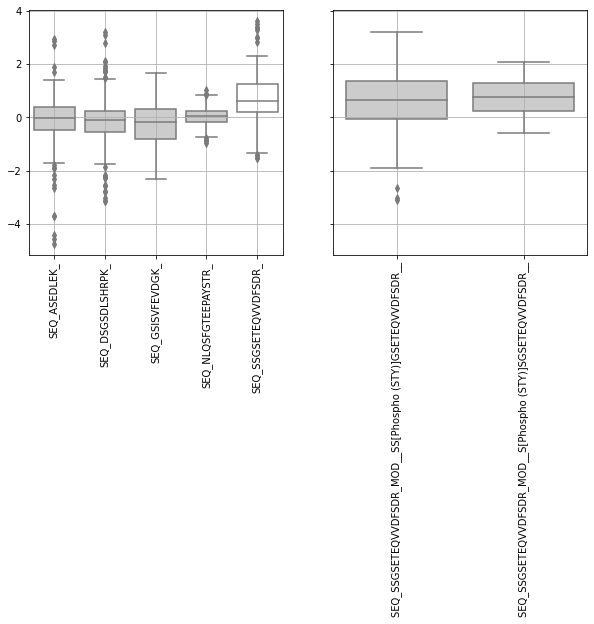

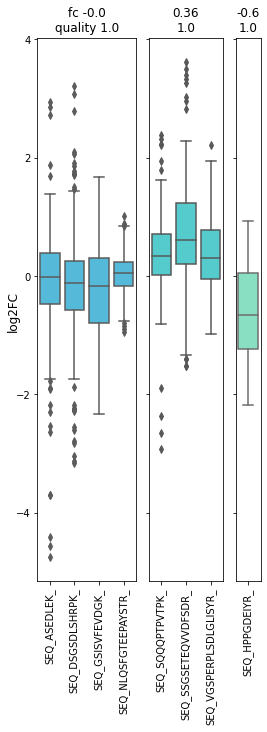

SEQ_APSTSPSFEGTQETYTVAHEENVR_
Q9BUT9
outlier fc 2.0452864095115975
modified fc 1.6878337247422008


outlier protnormed 2.141061944810681
modified protnormed 1.7836092600412843
False


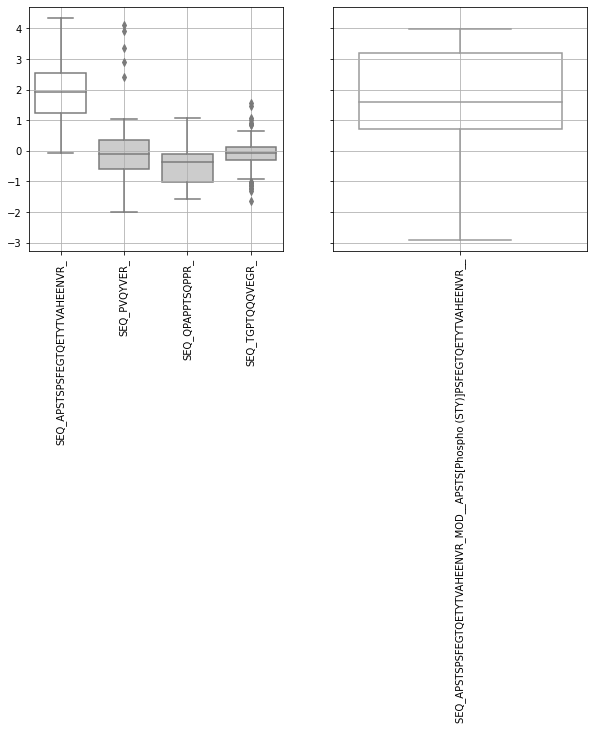

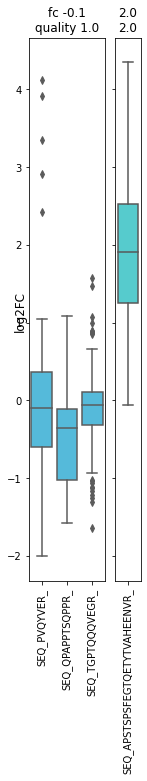

In [55]:
import matplotlib.pyplot as plt
import numpy as np

# Some example data to display
x = np.linspace(0, 2 * np.pi, 400)
y = np.sin(x ** 2)

def plot_complemented_cluster_condpairinfo(complemented_cluster,clusterdiff_list):
    fig, (ax1, ax2) = plt.subplots(1,2,sharey=True, sharex=False,figsize=(10,5))

    plot_peptides_of_protein(complemented_cluster,clusterdiff_list, ax1)
    plot_phospho_peptides(complemented_cluster, ax2)
    plt.subplots_adjust(bottom = 0.2)
    ax1.grid(True)
    ax2.grid(True)
    return fig



def plot_peptides_of_protein(complemented_cluster, clusterdiff_list, ax):
    condpairinfo_to_plot  = filter_relevant_condpairinfo_for_complemented_cluster(clusterdiff_list, complemented_cluster)
    peptides_to_plot = condpairinfo_to_plot.mainclust_peptide_names + [complemented_cluster.outlier_peptide.peptide_sequence]
    melted_plot_df = pepdf_getter.get_melted_ion_intensity_table_peptide_subset(protein=condpairinfo_to_plot.protein_name,peptides_to_plot=peptides_to_plot, specified_level="seq")
    fcplotter = aqplot.IonFoldChangePlotter(melted_df=melted_plot_df, condpair = CONDPAIR)
    ax_protein = fcplotter.plot_fcs_predscore_relative_strength(ax=ax)
    return ax_protein


def plot_phospho_peptides(complemented_cluster, ax):
    peptides_to_plot =  [x.name for x in complemented_cluster.modified_peptide._peptide_node.children]
    melted_plot_df = pepdf_getter_ptm.get_melted_ion_intensity_table_peptide_subset(protein=complemented_cluster.modified_peptide._peptide_node.parent.name,peptides_to_plot=peptides_to_plot, specified_level="mod_seq")
    fcplotter = aqplot.IonFoldChangePlotter(melted_df=melted_plot_df, condpair = CONDPAIR)
    ax_ptm = fcplotter.plot_fcs_predscore_relative_strength(ax=ax)
    return ax_ptm


def filter_relevant_condpairinfo_for_complemented_cluster(clusterdiff_list, complemented_cluster):
    return filter(lambda x : complemented_cluster.outlier_peptide.peptide_sequence in x.outlier_peptide_names ,clusterdiff_list).__next__()




def check_if_protein_name_contains(protein_nam, list_of_proteins):
    return any(protein_nam in x for x in list_of_proteins)

list_of_interesting_proteins = ["A0A0G2JNZ2", "Q53EL6", "Q9C0C2", "P02545", "A0A0C4DGG9", "Q8N7H5-3", "A0A087WV66", "Q96RS6", "P12956", "P54760"]
#filtered_clusters = [x for x in complemented_clusters if check_if_protein_name_contains(x.outlier_peptide._peptide_node.parent.name, list_of_interesting_proteins)]
filtered_clusters = [x for x in complemented_clusters if not x.has_opposite_regulation()]

count = 0
for clust in filtered_clusters:
    protnode = clust.outlier_peptide._peptide_node.parent
    print(clust.outlier_peptide.peptide_sequence)
    print(clust.outlier_peptide._peptide_node.parent.name)
    print(f"outlier fc {clust.outlier_peptide.fc}")
    print(f"modified fc {clust.modified_peptide.fc}")
    print("\n")
    print(f"outlier protnormed {clust.outlier_peptide.protnormed_fc}")
    print(f"modified protnormed {clust.modified_peptide.protnormed_fc}")
    print(np.sign(clust.outlier_peptide.protnormed_fc) == -np.sign(clust.modified_peptide.protnormed_fc))
    fig = plot_complemented_cluster_condpairinfo(clust, clusterdiff_list)
    #fig.show()
    plt.show()
    
    pcplotter = aqplot.ProteinClusterPlotter(protnode,CONDPAIR, pepdf_getter)
    pcplotter.plot_all_clusters_for_protein()
    count+=1
    



In [20]:
import pandas as pd
interesting_cluster_proteins = set(pd.read_csv("proteins_w_interesting_clusters.tsv", sep = "\t", header = None)[0].values)
df_100ng = pd.read_csv("20230411_100022_20230330_Constantin_aQ2_Report.filtered_to_100ng.tsv", sep = "\t")





In [21]:
display(df_100ng)
df_100ng_subset = df_100ng[df_100ng["PG.ProteinGroups"].isin(interesting_cluster_proteins)]
display(df_100ng_subset)
df_100ng_subset.to_csv("../cluster_tests/100ng_subset.tsv", sep = "\t", index = False)

,R.FileName,R.Label,PG.Genes,PG.Organisms,PG.ProteinGroups,PG.Quantity,PEP.NrOfMissedCleavages,PEP.MS1ChannelQuantities,PEP.MS2ChannelQuantities,PEP.StrippedSequence,...,F.PeakHeight,F.CalibratedMassAccuracy (PPM),F.HasChannelInterference,F.InterferenceScore,F.Log10SignalToNoise,F.Noise,F.PossibleInterference,F.PPMTolerance,F.RawMassAccuracy (PPM),F.Tolerance
0,20230330_EXPL0_MCT_SA_aQ2_HeLa_EGF_120min_100n...,20230330_EXPL0_MCT_SA_aQ2_HeLa_EGF_120min_100n...,SERPINB6,Homo sapiens,A0A024QZX5;A0A087X1N8;P35237,445048.406250,0,NaN,NaN,IAELLSPGSVDPLTR,...,3.961976e+06,0.210126,False,0.000000,2.314314,NaN,False,11.370174,3.306188,0.010705
1,20230330_EXPL0_MCT_SA_aQ2_HeLa_EGF_120min_100n...,20230330_EXPL0_MCT_SA_aQ2_HeLa_EGF_120min_100n...,SERPINB6,Homo sapiens,A0A024QZX5;A0A087X1N8;P35237,445048.406250,0,NaN,NaN,IAELLSPGSVDPLTR,...,2.812304e+06,1.763184,False,0.014920,2.240281,NaN,False,14.142968,4.581056,0.006878
2,20230330_EXPL0_MCT_SA_aQ2_HeLa_EGF_120min_100n...,20230330_EXPL0_MCT_SA_aQ2_HeLa_EGF_120min_100n...,SERPINB6,Homo sapiens,A0A024QZX5;A0A087X1N8;P35237,445048.406250,0,NaN,NaN,IAELLSPGSVDPLTR,...,3.011028e+06,-0.450437,False,0.082038,2.128606,NaN,False,11.855213,3.085769,0.012194
3,20230330_EXPL0_MCT_SA_aQ2_HeLa_EGF_120min_100n...,20230330_EXPL0_MCT_SA_aQ2_HeLa_EGF_120min_100n...,SERPINB6,Homo sapiens,A0A024QZX5;A0A087X1N8;P35237,445048.406250,0,NaN,NaN,IAELLSPGSVDPLTR,...,2.626228e+06,1.577546,False,0.666667,2.397201,NaN,False,10.349361,4.856841,0.003251
4,20230330_EXPL0_MCT_SA_aQ2_HeLa_EGF_120min_100n...,20230330_EXPL0_MCT_SA_aQ2_HeLa_EGF_120min_100n...,SERPINB6,Homo sapiens,A0A024QZX5;A0A087X1N8;P35237,445048.406250,0,NaN,NaN,IAELLSPGSVDPLTR,...,1.169095e+06,0.606573,False,0.392199,1.270610,NaN,False,13.316259,3.714207,0.005689
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7725734,20230330_EXPL0_MCT_SA_aQ2_HeLa_unt_120min_100n...,20230330_EXPL0_MCT_SA_aQ2_HeLa_unt_120min_100n...,SAP18,Homo sapiens,X6RAL5,115322.484375,1,NaN,NaN,KGTDDSMTLQSQK,...,8.726216e-01,NaN,False,0.291267,-5.419224,NaN,False,13.262922,NaN,0.006502
7725735,20230330_EXPL0_MCT_SA_aQ2_HeLa_unt_120min_100n...,20230330_EXPL0_MCT_SA_aQ2_HeLa_unt_120min_100n...,SAP18,Homo sapiens,X6RAL5,115322.484375,1,NaN,NaN,KGTDDSMTLQSQK,...,8.197030e-01,NaN,False,0.130260,0.170221,NaN,False,12.739284,NaN,0.007698
7725736,20230330_EXPL0_MCT_SA_aQ2_HeLa_unt_120min_100n...,20230330_EXPL0_MCT_SA_aQ2_HeLa_unt_120min_100n...,SAP18,Homo sapiens,X6RAL5,115322.484375,1,NaN,NaN,KGTDDSMTLQSQK,...,6.815866e-01,NaN,False,0.750819,-0.261093,NaN,True,12.743754,NaN,0.007689
7725737,20230330_EXPL0_MCT_SA_aQ2_HeLa_unt_120min_100n...,20230330_EXPL0_MCT_SA_aQ2_HeLa_unt_120min_100n...,SAP18,Homo sapiens,X6RAL5,115322.484375,1,NaN,NaN,KGTDDSMTLQSQK,...,7.421793e-01,NaN,False,0.454722,0.078828,NaN,True,12.338583,NaN,0.008691


,R.FileName,R.Label,PG.Genes,PG.Organisms,PG.ProteinGroups,PG.Quantity,PEP.NrOfMissedCleavages,PEP.MS1ChannelQuantities,PEP.MS2ChannelQuantities,PEP.StrippedSequence,...,F.PeakHeight,F.CalibratedMassAccuracy (PPM),F.HasChannelInterference,F.InterferenceScore,F.Log10SignalToNoise,F.Noise,F.PossibleInterference,F.PPMTolerance,F.RawMassAccuracy (PPM),F.Tolerance
3451,20230330_EXPL0_MCT_SA_aQ2_HeLa_EGF_120min_100n...,20230330_EXPL0_MCT_SA_aQ2_HeLa_EGF_120min_100n...,UHRF1,Homo sapiens,A0A087WTW0;A0A087WVR3;Q96T88;Q96T88-2,104068.570312,0,NaN,NaN,YAPAEGNR,...,358957.375000,-0.138127,False,0.000000,5.873472,NaN,False,14.278976,3.798894,0.007800
3452,20230330_EXPL0_MCT_SA_aQ2_HeLa_EGF_120min_100n...,20230330_EXPL0_MCT_SA_aQ2_HeLa_EGF_120min_100n...,UHRF1,Homo sapiens,A0A087WTW0;A0A087WVR3;Q96T88;Q96T88-2,104068.570312,0,NaN,NaN,YAPAEGNR,...,412388.406250,0.359776,False,0.000366,0.962517,NaN,False,14.447747,3.795035,0.009294
3453,20230330_EXPL0_MCT_SA_aQ2_HeLa_EGF_120min_100n...,20230330_EXPL0_MCT_SA_aQ2_HeLa_EGF_120min_100n...,UHRF1,Homo sapiens,A0A087WTW0;A0A087WVR3;Q96T88;Q96T88-2,104068.570312,0,NaN,NaN,YAPAEGNR,...,226333.437500,0.924042,False,0.015861,0.749767,NaN,False,14.082086,4.880491,0.006692
3454,20230330_EXPL0_MCT_SA_aQ2_HeLa_EGF_120min_100n...,20230330_EXPL0_MCT_SA_aQ2_HeLa_EGF_120min_100n...,UHRF1,Homo sapiens,A0A087WTW0;A0A087WVR3;Q96T88;Q96T88-2,104068.570312,0,NaN,NaN,YAPAEGNR,...,93873.078125,5.389687,False,0.666667,0.195714,NaN,True,11.272249,9.785136,0.003902
3455,20230330_EXPL0_MCT_SA_aQ2_HeLa_EGF_120min_100n...,20230330_EXPL0_MCT_SA_aQ2_HeLa_EGF_120min_100n...,UHRF1,Homo sapiens,A0A087WTW0;A0A087WVR3;Q96T88;Q96T88-2,104068.570312,0,NaN,NaN,YAPAEGNR,...,555199.562500,0.098970,False,0.015861,1.571953,NaN,False,10.559976,4.831106,0.003402
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7615104,20230330_EXPL0_MCT_SA_aQ2_HeLa_unt_120min_100n...,20230330_EXPL0_MCT_SA_aQ2_HeLa_unt_120min_100n...,NUCKS1,Homo sapiens,Q9H1E3,36110.726562,0,NaN,NaN,VVDYSQFQESDDADEDYGR,...,0.699875,-12.342808,False,0.000000,0.181787,NaN,False,12.384704,-7.321225,0.010222
7615105,20230330_EXPL0_MCT_SA_aQ2_HeLa_unt_120min_100n...,20230330_EXPL0_MCT_SA_aQ2_HeLa_unt_120min_100n...,NUCKS1,Homo sapiens,Q9H1E3,36110.726562,0,NaN,NaN,VVDYSQFQESDDADEDYGR,...,0.531865,NaN,False,0.165243,-0.048341,NaN,False,12.197536,NaN,0.009201
7615106,20230330_EXPL0_MCT_SA_aQ2_HeLa_unt_120min_100n...,20230330_EXPL0_MCT_SA_aQ2_HeLa_unt_120min_100n...,NUCKS1,Homo sapiens,Q9H1E3,36110.726562,0,NaN,NaN,VVDYSQFQESDDADEDYGR,...,0.710099,NaN,False,0.028266,0.341400,NaN,False,11.623334,NaN,0.013279
7615107,20230330_EXPL0_MCT_SA_aQ2_HeLa_unt_120min_100n...,20230330_EXPL0_MCT_SA_aQ2_HeLa_unt_120min_100n...,NUCKS1,Homo sapiens,Q9H1E3,36110.726562,0,NaN,NaN,VVDYSQFQESDDADEDYGR,...,0.534364,NaN,False,0.238267,0.100992,NaN,False,12.577175,NaN,0.008040


In [22]:
outlier_handler = aqoutlier.OutlierHandler(results_dir = results_dir, cond1 = condpair[0], cond2 = condpair[1])
diffcluster_list = outlier_handler.get_diffclust_overview_list()

NameError: name 'results_dir' is not defined

In [ ]:
import alphaquant.outlier_scoring as aqoutlier

dcfilt = aqoutlier.DiffClusterFilterer(clusterdiff_list, aqoutlier.DiffClusterFilterConfig(fcdiff_quantile=0.001, quality_score_quantile=1, num_mainclust_peptides_quantile=1).filterconfigs)


filtlist = dcfilt.get_filtered_clusterdiff_list()
print(len(filtlist))


4


(array([6.2000e+01, 3.8900e+02, 6.4000e+01, 2.2000e+01, 1.7000e+01,
        3.0000e+00, 3.3600e+02, 6.1254e+04, 0.0000e+00, 1.0000e+00]),
 array([-0.29464298, -0.08803172,  0.11857953,  0.32519079,  0.53180205,
         0.7384133 ,  0.94502456,  1.15163582,  1.35824707,  1.56485833,
         1.77146959]),
 <BarContainer object of 10 artists>)

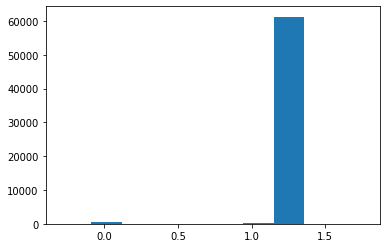

In [ ]:
all_peptides = anytree.findall(condpairtree_proteome, filter_= lambda x : getattr(x, 'type', '')== 'mod_seq_charge', maxlevel=5)
all_predscore = [x.predscore for x in all_peptides]

plt.hist(all_predscore)


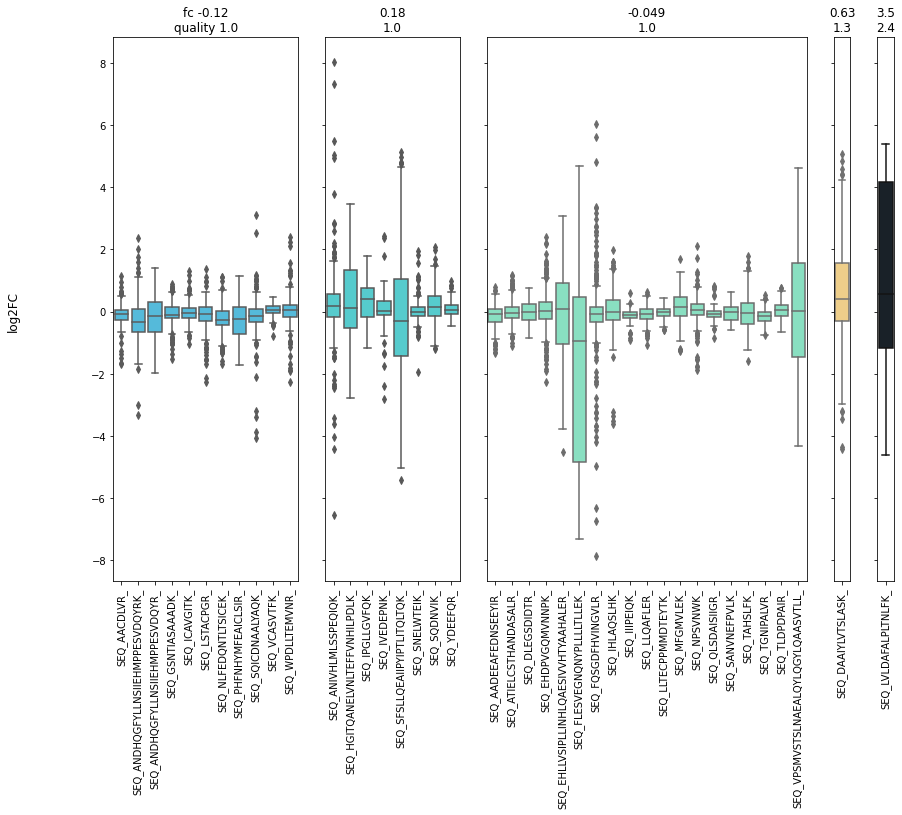

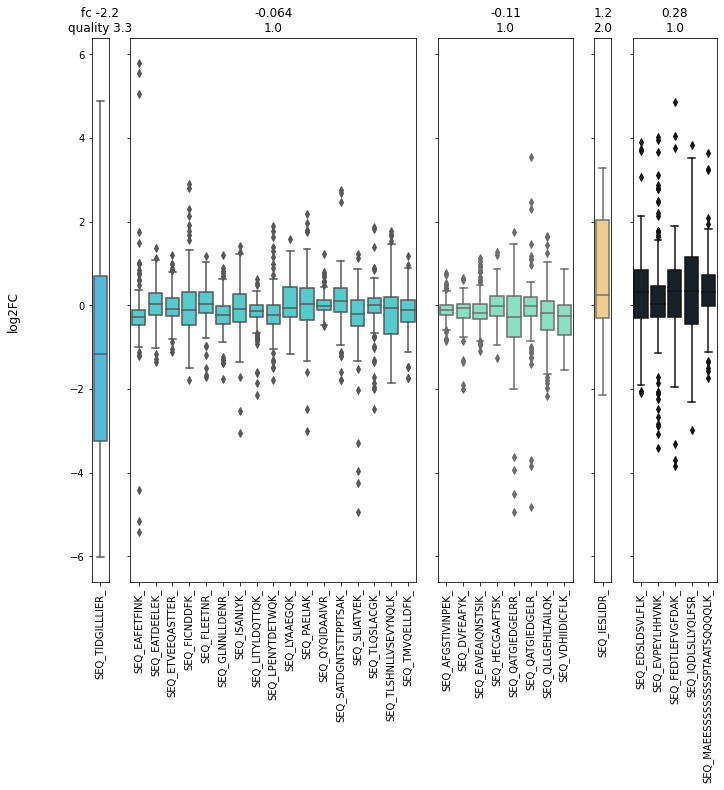

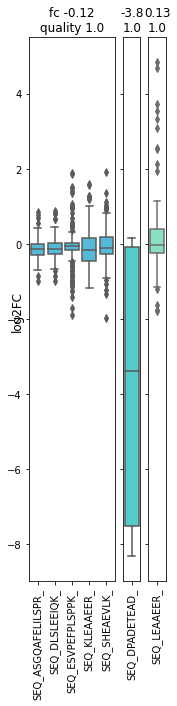

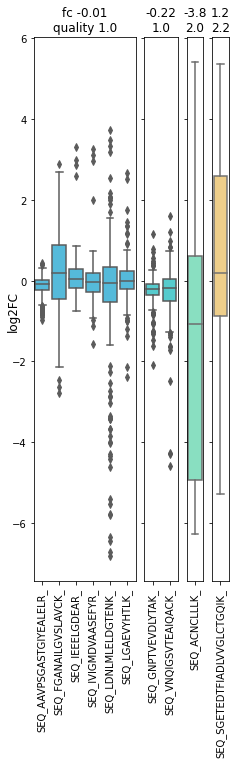

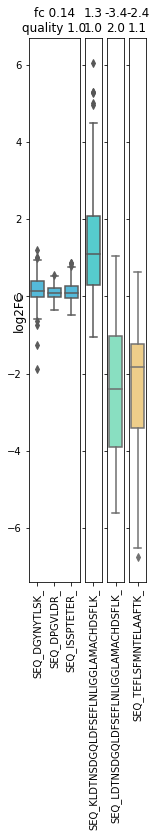

In [ ]:


for protnode in aqoutlier.ProtNodeRetriever.get_protnodes_from_clusterdiff_list(condpairtree_proteome, filtlist):
    pcplotter = ProteinClusterPlotter(protnode,condpair, pepdf_getter)
    pcplotter.plot_all_clusters_for_protein()